In [1]:
import os
import pandas as pd

## Reading dataset

In [2]:
path = "archive/20news-19997/20_newsgroups"
df = []

for folder in os.listdir(path):
    for file in os.listdir(f'{path}/{folder}'):
        f = open(f'{path}/{folder}/{file}', 'rb')
        df.append({'text': f.read(), 'newsgroup': folder})

In [3]:
df = pd.DataFrame(df)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19997 entries, 0 to 19996
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   text       19997 non-null  object
 1   newsgroup  19997 non-null  object
dtypes: object(2)
memory usage: 312.6+ KB


In [4]:
df.head()

,text,newsgroup
0,"b""Newsgroups: sci.space\nPath: cantaloupe.srv....",sci.space
1,b'Newsgroups: sci.space\nPath: cantaloupe.srv....,sci.space
2,"b""Newsgroups: sci.space\nPath: cantaloupe.srv....",sci.space
3,b'Newsgroups: sci.space\nPath: cantaloupe.srv....,sci.space
4,b'Newsgroups: sci.space\nPath: cantaloupe.srv....,sci.space


In [5]:
df["text"][0]

b"Newsgroups: sci.space\nPath: cantaloupe.srv.cs.cmu.edu!rochester!udel!bogus.sura.net!news-feed-1.peachnet.edu!gatech!swrinde!sdd.hp.com!ux1.cso.uiuc.edu!news.cso.uiuc.edu!uxa.cso.uiuc.edu!gfk39017\nFrom: gfk39017@uxa.cso.uiuc.edu (George F. Krumins)\nSubject: Re: space news from Feb 15 AW&ST\nDate: Fri, 23 Apr 1993 20:16:24 GMT\nMessage-ID: <C5yDnC.GwB@news.cso.uiuc.edu>\nReferences: <C5ros0.uy@zoo.toronto.edu> <1993Apr23.155313.4220@dazixco.ingr.com>\nSender: usenet@news.cso.uiuc.edu (Net Noise owner)\nOrganization: University of Illinois at Urbana\nLines: 23\n\njbreed@doink.b23b.ingr.com (James B. Reed) writes:\n\n>In article <C5ros0.uy@zoo.toronto.edu>, henry@zoo.toronto.edu (Henry Spencer) writes:\n>|> [Pluto's] atmosphere will start to freeze out around 2010, and after about\n>|> 2005 increasing areas of both Pluto and Charon will be in permanent\n>|> shadow that will make imaging and geochemical mapping impossible.\n\nIt's my understanding that the freezing will start to occur 

## Converting bytes to string

In [6]:
def bytes_to_str(text):
    return text.decode('utf-8', errors = 'ignore')
df["text"]=df["text"].apply(bytes_to_str)

In [7]:
df

,text,newsgroup
0,Newsgroups: sci.space\nPath: cantaloupe.srv.cs...,sci.space
1,Newsgroups: sci.space\nPath: cantaloupe.srv.cs...,sci.space
2,Newsgroups: sci.space\nPath: cantaloupe.srv.cs...,sci.space
3,Newsgroups: sci.space\nPath: cantaloupe.srv.cs...,sci.space
4,Newsgroups: sci.space\nPath: cantaloupe.srv.cs...,sci.space
...,...,...
19992,Xref: cantaloupe.srv.cs.cmu.edu soc.culture.tu...,talk.politics.mideast
19993,Path: cantaloupe.srv.cs.cmu.edu!magnesium.club...,talk.politics.mideast
19994,Newsgroups: talk.politics.mideast\nPath: canta...,talk.politics.mideast
19995,Xref: cantaloupe.srv.cs.cmu.edu soc.culture.ar...,talk.politics.mideast


In [8]:
df["newsgroup"].nunique()

20

## Removing headers

In [9]:
def remove_header(text):
    split_text = text.split('\n\n', 1)
    if len(split_text) > 1:
        return split_text[1]
    return text
df["text"] = df["text"].apply(remove_header)

## Dividing into build and valid datasets

In [10]:
from sklearn.model_selection import train_test_split

print(df.shape)

X_build, X_val = train_test_split(
    df,
    test_size=0.3, random_state=213)

print("X_build shape: {}".format(X_build.shape))
print("X_val shape: {}".format(X_val.shape))

(19997, 2)
X_build shape: (13997, 2)
X_val shape: (6000, 2)


In [11]:
df = X_build.copy()
original_df = df.copy()

### Counting sentences

In [12]:
from nltk.tokenize import sent_tokenize
df["sentences"]=df["text"].apply(sent_tokenize).apply(len)

### Counting question and exclamation marks

In [13]:
df["question_marks_ratio"] = df["text"].str.count("\?")/df["sentences"]
df["exclamation_marks_ratio"] = df["text"].str.count("\!")/df["sentences"]

### Counting links

In [14]:
df["links"] = df["text"].str.count(r'https?://\S+|www\.\S+')

### Counting e-mail addresses

In [15]:
df["emails_addresses"] = df["text"].str.count(r'\b[A-Za-z0-9._%+-]+@[A-Za-z0-9.-]+\.[A-Za-z]{2,}\b')

## Cleaning

In [16]:
import string
import re

def clean(df):
    df["text"] = df['text'].str.replace('https?://\S+|www\.\S+', '', regex = True) # links
    df["text"] = df["text"].str.replace(r'\b[A-Za-z0-9._%+-]+@[A-Za-z0-9.-]+\.[A-Za-z]{2,}\b', '', regex = True) # e-mail adresses
    df["text"] = df['text'].str.replace('<.*?>+', '', regex = True) # tags
    df["text"] = df['text'].str.replace('\[.*?\]', '', regex = True) # square brackets
    df["text"] = df['text'].str.replace('[%s]' % re.escape(string.punctuation), '', regex = True) # puntuation marks
    df["text"] = df['text'].str.replace('\n', ' ', regex = True) # newline character
    df["text"] = df['text'].str.replace("\\W"," ", regex = True) # non-alphanumeric characters
    df["text"] = df['text'].str.replace('\w*\d\w*', '', regex = True) # numeric sequences
    df["text"] = df['text'].str.replace(r'\b\w\b', '', regex = True) # one-letter words
    df["text"] = df['text'].str.replace(r'\s+', ' ', regex = True) # empty spaces
    return df

df = clean(df)
df.head()

,text,newsgroup,sentences,question_marks_ratio,exclamation_marks_ratio,links,emails_addresses
12727,In article Robert Castro writes Would anyone o...,rec.motorcycles,14,0.071429,0.571429,0,3
12958,In article Jerry Hartzler CATS writes In artic...,rec.motorcycles,5,0.000000,0.000000,0,5
17116,try to unsubscribe from this group by sending...,comp.windows.x,4,0.250000,0.000000,0,1
6186,In article John Eaton writes Thats one problem...,sci.crypt,13,0.230769,0.000000,0,2
6782,The key question is whether nonClipper encrypt...,sci.crypt,16,0.125000,0.000000,0,1


## Spacy - 'ORG', 'MONEY', 'PERSON', 'COMPANY', 'GPE', 'DATE'

In [17]:
import spacy
import pandas as pd

def extract_named_entities(df):
    nlp = spacy.load("en_core_web_sm")

    entity_types = ['ORG', 'MONEY', 'PERSON', 'COMPANY', 'GPE', 'DATE']
    new_columns = ['{}_entities'.format(entity_type.lower()) for entity_type in entity_types]
    df[new_columns] = pd.DataFrame([[None] * len(new_columns)], index=df.index)

    for i, row in df.iterrows():
        text = row['text']

        doc = nlp(text)

        entities = {entity_type: [] for entity_type in entity_types}
        for ent in doc.ents:
            if ent.label_ in entities:
                entities[ent.label_].append(ent.text)

        for entity_type, values in entities.items():
            df.at[i, '{}_entities'.format(entity_type.lower())] = ', '.join(values)

    return df

2023-06-18 18:56:25.501503: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-06-18 18:56:26.209857: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2023-06-18 18:56:26.913340: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:996] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-06-18 18:56:26.969352: W tensorflow/core/common_runtime/gpu/gpu_device.cc:1956] Cannot dlopen some GPU libraries. Please make sure the missing libraries mentioned above are installed properly if you would like to use GP

In [18]:
df = extract_named_entities(df)

In [19]:
df

,text,newsgroup,sentences,question_marks_ratio,exclamation_marks_ratio,links,emails_addresses,org_entities,money_entities,person_entities,company_entities,gpe_entities,date_entities
12727,In article Robert Castro writes Would anyone o...,rec.motorcycles,14,0.071429,0.571429,0,3,"Velcro, Cochran, US Cavalry, Tankers, NAVY, BUY",,"Robert Castro, Richard Pierson",,"Clothing, wellington, Nice",
12958,In article Jerry Hartzler CATS writes In artic...,rec.motorcycles,5,0.000000,0.000000,0,5,"Extra, WPM",,"Jerry Hartzler, Michael Manning, Chris Behanna...",,DoD,
17116,try to unsubscribe from this group by sending...,comp.windows.x,4,0.250000,0.000000,0,1,Thanks Philip Nguyen Research Engineer Flexibl...,,,,,this Friday April
6186,In article John Eaton writes Thats one problem...,sci.crypt,13,0.230769,0.000000,0,2,,,"John Eaton, Keys, David David Sternlight Great",,,
6782,The key question is whether nonClipper encrypt...,sci.crypt,16,0.125000,0.000000,0,1,"nonClipper, Administration, the Clipper Chip, ...",,"Dorothy Dennings, Hal Finney",,US,years
...,...,...,...,...,...,...,...,...,...,...,...,...,...
11051,The price you have on the seems very good too ...,comp.sys.mac.hardware,5,0.000000,0.000000,0,0,,,,,,
17409,What has this got to do with compwindowsx Just...,comp.windows.x,4,0.250000,0.000000,0,1,Programmer XMelba Project Team CATT Collaborat...,,Justin Kibell,,Australia,
8032,was watching the DetroitMinnesota game last n...,rec.sport.hockey,5,0.400000,0.400000,0,2,Detroit Not Responsible Dain Bramaged,,"Ysebaert, Harold Zazula",,DetroitMinnesota,
13540,In article Jon Livesey writes In article Dougl...,alt.atheism,17,0.058824,0.000000,0,5,"Heres, the Albany Plan of Union, the Articles ...",,"Jon Livesey, Douglas Graham, Jerry Manders, Sa...",,"Iroquois, US, USSR, Iroquois, Iroquois",


In [20]:
import pandas as pd

def calculate_word_vector_length(df, column_name):
    new_column_name = column_name + '_length'
    df[new_column_name] = df[column_name].apply(lambda x: len(x.replace(' ', ',').split(',')) if x.strip() else 0)
    return df


In [21]:
df = calculate_word_vector_length(df, 'org_entities')
df = calculate_word_vector_length(df, 'money_entities')
df = calculate_word_vector_length(df, 'person_entities')
df = calculate_word_vector_length(df, 'company_entities')
df = calculate_word_vector_length(df, 'gpe_entities')
df = calculate_word_vector_length(df, 'date_entities')
df

,text,newsgroup,sentences,question_marks_ratio,exclamation_marks_ratio,links,emails_addresses,org_entities,money_entities,person_entities,company_entities,gpe_entities,date_entities,org_entities_length,money_entities_length,person_entities_length,company_entities_length,gpe_entities_length,date_entities_length
12727,In article Robert Castro writes Would anyone o...,rec.motorcycles,14,0.071429,0.571429,0,3,"Velcro, Cochran, US Cavalry, Tankers, NAVY, BUY",,"Robert Castro, Richard Pierson",,"Clothing, wellington, Nice",,12,0,5,0,5,0
12958,In article Jerry Hartzler CATS writes In artic...,rec.motorcycles,5,0.000000,0.000000,0,5,"Extra, WPM",,"Jerry Hartzler, Michael Manning, Chris Behanna...",,DoD,,3,0,12,0,1,0
17116,try to unsubscribe from this group by sending...,comp.windows.x,4,0.250000,0.000000,0,1,Thanks Philip Nguyen Research Engineer Flexibl...,,,,,this Friday April,14,0,0,0,0,3
6186,In article John Eaton writes Thats one problem...,sci.crypt,13,0.230769,0.000000,0,2,,,"John Eaton, Keys, David David Sternlight Great",,,,0,0,9,0,0,0
6782,The key question is whether nonClipper encrypt...,sci.crypt,16,0.125000,0.000000,0,1,"nonClipper, Administration, the Clipper Chip, ...",,"Dorothy Dennings, Hal Finney",,US,years,11,0,5,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11051,The price you have on the seems very good too ...,comp.sys.mac.hardware,5,0.000000,0.000000,0,0,,,,,,,0,0,0,0,0,0
17409,What has this got to do with compwindowsx Just...,comp.windows.x,4,0.250000,0.000000,0,1,Programmer XMelba Project Team CATT Collaborat...,,Justin Kibell,,Australia,,10,0,2,0,1,0
8032,was watching the DetroitMinnesota game last n...,rec.sport.hockey,5,0.400000,0.400000,0,2,Detroit Not Responsible Dain Bramaged,,"Ysebaert, Harold Zazula",,DetroitMinnesota,,5,0,4,0,1,0
13540,In article Jon Livesey writes In article Dougl...,alt.atheism,17,0.058824,0.000000,0,5,"Heres, the Albany Plan of Union, the Articles ...",,"Jon Livesey, Douglas Graham, Jerry Manders, Sa...",,"Iroquois, US, USSR, Iroquois, Iroquois",,32,0,24,0,9,0


In [22]:
df = df.drop(['org_entities', 'money_entities', 'person_entities', 'company_entities', 'gpe_entities', 'date_entities'], axis = 1)

## Converting to lowercase

In [23]:
df["chars"]=df["text"].str.len()
df["capital_letters_ratio"] = df["text"].str.count(r'[A-Z]')/df["text"].str.count(r'[A-za-z]')
df["text"] = df['text'].str.lower()

## Counting ratio for entities

In [24]:
df['organizations_ratio'] = df['org_entities_length']/df['chars']
df['money_ratio'] = df['money_entities_length']/df['chars']
df['person_ratio'] = df['person_entities_length']/df['chars']
df['company_ratio'] = df['company_entities_length']/ df['chars']
df['gpe_ratio'] = df['gpe_entities_length']/ df['chars']
df['date_ratio'] = df['date_entities_length']/df['chars']

In [25]:
df = df.drop(['org_entities_length','money_entities_length','person_entities_length','company_entities_length','gpe_entities_length','date_entities_length'], axis = 1)
df

,text,newsgroup,sentences,question_marks_ratio,exclamation_marks_ratio,links,emails_addresses,chars,capital_letters_ratio,organizations_ratio,money_ratio,person_ratio,company_ratio,gpe_ratio,date_ratio
12727,in article robert castro writes would anyone o...,rec.motorcycles,14,0.071429,0.571429,0,3,1335,0.058878,0.008989,0.0,0.003745,0.0,0.003745,0.000000
12958,in article jerry hartzler cats writes in artic...,rec.motorcycles,5,0.000000,0.000000,0,5,402,0.072508,0.007463,0.0,0.029851,0.0,0.002488,0.000000
17116,try to unsubscribe from this group by sending...,comp.windows.x,4,0.250000,0.000000,0,1,397,0.081818,0.035264,0.0,0.000000,0.0,0.000000,0.007557
6186,in article john eaton writes thats one problem...,sci.crypt,13,0.230769,0.000000,0,2,1334,0.018051,0.000000,0.0,0.006747,0.0,0.000000,0.000000
6782,the key question is whether nonclipper encrypt...,sci.crypt,16,0.125000,0.000000,0,1,1906,0.018657,0.005771,0.0,0.002623,0.0,0.000525,0.000525
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11051,the price you have on the seems very good too ...,comp.sys.mac.hardware,5,0.000000,0.000000,0,0,258,0.110577,0.000000,0.0,0.000000,0.0,0.000000,0.000000
17409,what has this got to do with compwindowsx just...,comp.windows.x,4,0.250000,0.000000,0,1,195,0.136095,0.051282,0.0,0.010256,0.0,0.005128,0.000000
8032,was watching the detroitminnesota game last n...,rec.sport.hockey,5,0.400000,0.400000,0,2,251,0.053398,0.019920,0.0,0.015936,0.0,0.003984,0.000000
13540,in article jon livesey writes in article dougl...,alt.atheism,17,0.058824,0.000000,0,5,2611,0.045057,0.012256,0.0,0.009192,0.0,0.003447,0.000000


## Removing stopwords

In [26]:
from nltk.corpus import stopwords

def remove_stopwords(text):
 stop = set(stopwords.words('english'))
 text = [word for word in text.split() if word not in stop]
 text = ' '.join(x for x in text)
 return text

df['text'] = df['text'].apply(remove_stopwords)

## Cleaning missing data

In [27]:
df = df[(df["text"] != '') & (df["text"] != '[]')]

In [28]:
df["text"] = df["text"].apply(str)

/tmp/ipykernel_26088/1434408237.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["text"] = df["text"].apply(str)


## POS tagging and lemmatization

In [29]:
from nltk.corpus import wordnet
import nltk
from nltk.stem import WordNetLemmatizer

def pos_tag_and_lemmatize(text):
    tokens = nltk.word_tokenize(text)
    pos_tags = nltk.pos_tag(tokens)

    lemmas = []
    noun_count = 0
    adj_count = 0
    verb_count = 0
    adv_count = 0
    token_count = len(tokens)
    unique_words = len(set(tokens))

    if token_count == 0:
        return lemmas, noun_count, adj_count, verb_count, adv_count, token_count, unique_words

    lemmatizer = WordNetLemmatizer()

    for token, pos in pos_tags:
        wn_pos = nltk.corpus.wordnet.NOUN
        if pos.startswith('J'):
            wn_pos = wordnet.ADJ
            adj_count += 1
        elif pos.startswith('V'):
            wn_pos = wordnet.VERB
            verb_count += 1
        elif pos.startswith('R'):
            wn_pos = wordnet.ADV
            adv_count += 1
        else:
            noun_count += 1

        lemma = lemmatizer.lemmatize(token, pos=wn_pos)
        lemmas.append(lemma)

    noun_ratio = noun_count/token_count
    adj_ratio = adj_count/token_count
    verb_ratio = verb_count/token_count
    adv_ratio = adv_count/token_count

    lemmas = " ".join(lemmas)

    return lemmas, noun_ratio, adj_ratio, verb_ratio, adv_ratio, token_count, unique_words

# Apply POS-tagging, lemmatization, and count to the DataFrame
df[['text', 'noun_ratio', 'adj_ratio', 'verb_ratio', 'adv_ratio', 'words', 'unique_words']] = df['text'].apply(pos_tag_and_lemmatize).apply(pd.Series)

/tmp/ipykernel_26088/4038826019.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[['text', 'noun_ratio', 'adj_ratio', 'verb_ratio', 'adv_ratio', 'words', 'unique_words']] = df['text'].apply(pos_tag_and_lemmatize).apply(pd.Series)
/tmp/ipykernel_26088/4038826019.py:49: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[['text', 'noun_ratio', 'adj_ratio', 'verb_ratio', 'adv_ratio', 'words', 'unique_words']] = df['text'].apply(pos_tag_and_lemmatize).apply(pd.Series)
/tmp/ipykernel_26088/4038826019.py:49: S

## Grouping by similar words

In [30]:
import spacy
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.metrics.pairwise import cosine_similarity

def group_records_by_similar_words(df):
    # Load spaCy model
    nlp = spacy.load("en_core_web_sm")

    # Tokenize and vectorize the text
    tokenized_text = []
    vectors = []
    for doc in nlp.pipe(df['text'], batch_size=1000):
        tokenized_text.append([token.text for token in doc])
        vectors.append(doc.vector)

    # Compute cosine similarity matrix
    similarity_matrix = cosine_similarity(vectors)

    # Apply K-means clustering
    k = int(len(df) ** 0.5)  # Determine the number of clusters
    kmeans = KMeans(n_clusters=k, random_state=42)
    cluster_labels = kmeans.fit_predict(similarity_matrix)

    # Add cluster labels to the DataFrame
    df['cluster'] = cluster_labels

    return df

## Lexical diversity

In [31]:
df['lexical_div'] = df['words'] / df['unique_words']

/tmp/ipykernel_26088/2291121900.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['lexical_div'] = df['words'] / df['unique_words']


## Average word length

In [32]:
df['avg_word_length'] = df['chars'] / df['words']

/tmp/ipykernel_26088/2185371058.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['avg_word_length'] = df['chars'] / df['words']


## Sentiment analysis

In [33]:
from nltk.sentiment import SentimentIntensityAnalyzer

sia = SentimentIntensityAnalyzer()

# Calculate the sentiment scores for all texts
sentiment_scores = df['text'].apply(lambda text: sia.polarity_scores(text))

# Extract negative, positive, and neutral scores into separate columns
df['negative'] = sentiment_scores.apply(lambda score: score['neg'])
df['positive'] = sentiment_scores.apply(lambda score: score['pos'])
df['neutral'] = sentiment_scores.apply(lambda score: score['neu'])

/tmp/ipykernel_26088/4061726439.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['negative'] = sentiment_scores.apply(lambda score: score['neg'])
/tmp/ipykernel_26088/4061726439.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['positive'] = sentiment_scores.apply(lambda score: score['pos'])
/tmp/ipykernel_26088/4061726439.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in 

In [34]:
df.head()

,text,newsgroup,sentences,question_marks_ratio,exclamation_marks_ratio,links,emails_addresses,chars,capital_letters_ratio,organizations_ratio,...,adj_ratio,verb_ratio,adv_ratio,words,unique_words,lexical_div,avg_word_length,negative,positive,neutral
12727,article robert castro writes would anyone dodl...,rec.motorcycles,14,0.071429,0.571429,0,3,1335,0.058878,0.008989,...,0.167883,0.218978,0.051095,137,117,1.170940,9.744526,0.033,0.139,0.828
12958,article jerry hartzler cat write article micha...,rec.motorcycles,5,0.000000,0.000000,0,5,402,0.072508,0.007463,...,0.153846,0.205128,0.102564,39,36,1.083333,10.307692,0.068,0.093,0.839
17116,try unsubscribe group send email doesnt work c...,comp.windows.x,4,0.250000,0.000000,0,1,397,0.081818,0.035264,...,0.238095,0.142857,0.023810,42,40,1.050000,9.452381,0.027,0.107,0.867
6186,article john eaton write thats one problem far...,sci.crypt,13,0.230769,0.000000,0,2,1334,0.018051,0.000000,...,0.166667,0.191667,0.058333,120,109,1.100917,11.116667,0.129,0.218,0.653
6782,key question whether nonclipper encryption mak...,sci.crypt,16,0.125000,0.000000,0,1,1906,0.018657,0.005771,...,0.224852,0.242604,0.053254,169,134,1.261194,11.278107,0.120,0.231,0.649


## Scaling

In [35]:
df_numeric = df.select_dtypes(include=['float','int'])
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler().fit(df_numeric)
df_numeric = pd.DataFrame(scaler.transform(df_numeric), index=df_numeric.index,
                                 columns=df_numeric.columns)
df_numeric

,sentences,question_marks_ratio,exclamation_marks_ratio,links,emails_addresses,chars,capital_letters_ratio,organizations_ratio,money_ratio,person_ratio,...,adj_ratio,verb_ratio,adv_ratio,words,unique_words,lexical_div,avg_word_length,negative,positive,neutral
12727,0.009630,0.007185,0.034632,0.0,0.011278,0.020549,0.058878,0.080899,0.0,0.014981,...,0.223844,0.218978,0.059611,0.021411,0.056641,0.006030,0.208408,0.033,0.139,0.828
12958,0.002963,0.000000,0.000000,0.0,0.018797,0.006145,0.072508,0.067164,0.0,0.119403,...,0.205128,0.205128,0.119658,0.005982,0.017090,0.002939,0.228839,0.068,0.093,0.839
17116,0.002222,0.025148,0.000000,0.0,0.003759,0.006067,0.081818,0.317380,0.0,0.000000,...,0.317460,0.142857,0.027778,0.006455,0.019043,0.001764,0.197809,0.027,0.107,0.867
6186,0.008889,0.023213,0.000000,0.0,0.007519,0.020533,0.018051,0.000000,0.0,0.026987,...,0.222222,0.191667,0.068056,0.018734,0.052734,0.003560,0.258188,0.129,0.218,0.653
6782,0.011111,0.012574,0.000000,0.0,0.003759,0.029364,0.018657,0.051941,0.0,0.010493,...,0.299803,0.242604,0.062130,0.026448,0.064941,0.009213,0.264045,0.120,0.231,0.649
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11051,0.002963,0.000000,0.000000,0.0,0.000000,0.003921,0.110577,0.000000,0.0,0.000000,...,0.222222,0.333333,0.048611,0.003621,0.010742,0.001534,0.244886,0.000,0.273,0.727
17409,0.002222,0.025148,0.000000,0.0,0.003759,0.002949,0.136095,0.461538,0.0,0.041026,...,0.200000,0.150000,0.000000,0.002991,0.009277,0.000000,0.208606,0.000,0.000,1.000
8032,0.002963,0.040237,0.024242,0.0,0.007519,0.003813,0.053398,0.179283,0.0,0.063745,...,0.266667,0.240000,0.000000,0.003778,0.010742,0.003067,0.219127,0.000,0.087,0.913
13540,0.011852,0.005917,0.000000,0.0,0.018797,0.040248,0.045057,0.110303,0.0,0.036768,...,0.238889,0.212500,0.058333,0.037626,0.090332,0.010241,0.249572,0.077,0.210,0.713


## Correlated numeric columns

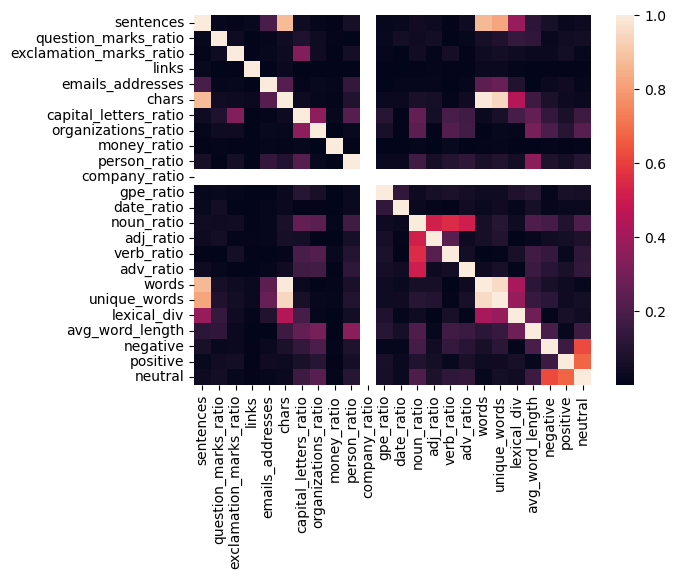

In [36]:
import numpy as np
import seaborn as sb

corr_matrix = df_numeric.corr(method="pearson").abs()
upper_tri = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))
to_drop = [column for column in upper_tri.columns if any(upper_tri[column] > 0.9)]
dfplot = sb.heatmap(corr_matrix)

In [37]:
df_numeric = df_numeric.drop(to_drop, axis=1)
to_drop

['words', 'unique_words']

## Vectorizing

### CountVectorizer

In [38]:
import warnings
import re
from sklearn.feature_extraction.text import CountVectorizer

# Suppress the warning
warnings.filterwarnings("ignore", category=UserWarning)

count_vectorizer = CountVectorizer(stop_words = "english")
count_df = count_vectorizer.fit_transform(df["text"])
count_df

<13966x82215 sparse matrix of type '<class 'numpy.int64'>'
	with 1089507 stored elements in Compressed Sparse Row format>

### TfidfVectorizer

In [39]:
from sklearn.feature_extraction.text import TfidfVectorizer

tfidf_vectorizer = TfidfVectorizer(stop_words = "english", max_df=0.7, max_features=7000)
tfidf_df = tfidf_vectorizer.fit_transform(df["text"])
tfidf_df

<13966x7000 sparse matrix of type '<class 'numpy.float64'>'
	with 889099 stored elements in Compressed Sparse Row format>

## Differences between vectorizers

In [40]:
count_df = pd.DataFrame(count_df.A, columns = count_vectorizer.get_feature_names_out())
tfidf_df = pd.DataFrame(tfidf_df.A, columns = tfidf_vectorizer.get_feature_names_out())
difference = set(count_df.columns) - set(tfidf_df.columns)
print(difference)

{'workingclass', 'cond', 'trump', 'lustfully', 'kamin', 'hardtofind', 'survives', 'prohomosexual', 'cutback', 'xiantiy', 'zohar', 'canadafrancegermany', 'apdownbox', 'knuckle', 'aquire', 'mightest', 'centripital', 'guygal', 'intifadah', 'gunfreezones', 'incubator', 'intertestiment', 'unimpeded', 'proportionate', 'stephane', 'iacrs', 'buildup', 'dustdirt', 'floorsi', 'xraylike', 'rudecoming', 'drunkstonedcrazy', 'nitrocellulose', 'mariolemieux', 'professionally', 'arcsecond', 'myktotronx', 'exceeing', 'nralp', 'thornley', 'islande', 'beatles', 'pssstlet', 'shopper', 'tuber', 'fullsystem', 'karabag', 'rekindle', 'eeprom', 'stddisclaimer', 'halfhearted', 'constuct', 'flatpack', 'chardr', 'gallivani', 'xwdformat', 'inimicable', 'carlike', 'substantiation', 'autoforwarding', 'signifacantly', 'hotly', 'committment', 'dmd', 'hivinhibitory', 'vandalism', 'wellthats', 'clearcoat', 'egotism', 'kippur', 'feyruzovich', 'faxes', 'affirmative', 'standalone', 'kashmir', 'yao', 'heresey', 'summarily',

In [41]:
from scipy.sparse import hstack, csr_matrix

other_df = hstack([csr_matrix(df_numeric)])

In [42]:
other_df.shape

(13966, 22)

# Dendogram

In [43]:
import numpy as np
from scipy.spatial.distance import pdist, squareform

def create_distance_matrix(dataset, subset_size=1000):
    # Randomly select a subset of data points
    indices = np.random.choice(dataset.shape[0], size=subset_size, replace=False)
    subset = dataset.iloc[indices, :]

    # Compute pairwise distances between subset data points using Euclidean distance
    distance_matrix = pdist(subset.values, metric='euclidean')

    # Convert the pairwise distances to a square distance matrix
    distance_matrix = squareform(distance_matrix)

    return distance_matrix


In [44]:

distance_matrix = create_distance_matrix(tfidf_df, subset_size=5000)

In [45]:
import matplotlib.pyplot as plt
from scipy.cluster.hierarchy import dendrogram, linkage

def draw_dendrogram(distance_matrix):
    # Perform hierarchical clustering using the distance matrix
    linkage_matrix = linkage(distance_matrix, method='ward')

    # Plot the dendrogram
    plt.figure(figsize=(10, 6))
    dendrogram(linkage_matrix)
    plt.xlabel('Data Points')
    plt.ylabel('Distance')
    plt.title('Dendrogram')
    plt.show()


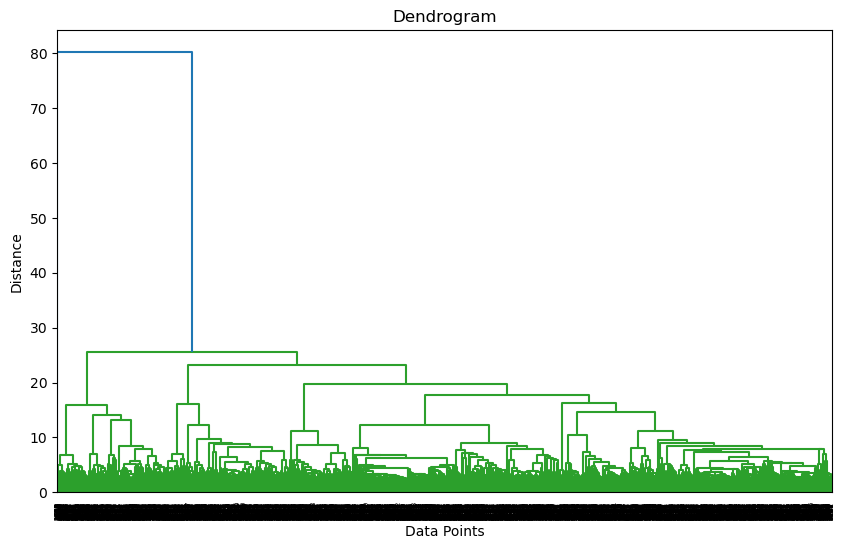

In [46]:

draw_dendrogram(distance_matrix)

# Clustering models

## Clustering scores

In [47]:
def print_scores(model, dataset, predictions, labels = df["newsgroup"]):
    print("Within-cluster sum of squares: %0.3f" % model.score(dataset))
    print("Silhouette Score: %0.3f" % silhouette_score(dataset, model.labels_, metric='euclidean'))
    print("Calinski Harabasz Score: %0.3f" % calinski_harabasz_score(dataset, model.labels_))
    print("Davies Bouldin: %0.3f" % davies_bouldin_score(dataset, predictions))
    print("Homogeneity: %0.3f" % metrics.homogeneity_score(labels, model.labels_))
    # print("Completeness: %0.3f" % metrics.completeness_score(labels, model.labels_))
    # print("V-measure: %0.3f" % metrics.v_measure_score(labels, model.labels_))
    # print("Adjusted Rand-Index: %.3f"
    #       % metrics.adjusted_rand_score(labels, model.labels_))
    # print("Silhouette Coefficient: %0.3f"
    #       % metrics.silhouette_score(tfidf_df, model.labels_, sample_size=1000))

## Most releveant terms

In [48]:
def print_most_relevant_terms(model, vectorizer,  n_of_clusters=20):
    centroids = model.cluster_centers_.argsort()[:, ::-1] ## Indices of largest centroids' entries in descending order
    terms = vectorizer.get_feature_names_out()
    for i in range(n_of_clusters):
        print("Cluster %d:" % i, end='')
        for ind in centroids[i, :10]:
            print(' %s' % terms[ind], end='')
        print()
    return centroids, terms

In [49]:
def plot_clusters(model, df, predictions):
    plt.figure(figsize=(8, 6))
    plt.scatter(df.iloc[:, 0], df.iloc[:, 1], c=predictions, cmap='viridis')
    plt.xlabel('Feature 1')
    plt.ylabel('Feature 2')
    plt.title('Clusters')
    plt.show()

## Clustering using k-means

In [50]:
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score
from sklearn.cluster import KMeans
from sklearn import metrics
def kmeans(dataset, n_clusters = 20):
    model = KMeans(n_clusters, random_state = 101, n_init = 10)
    predictions = model.fit_predict(dataset)
    print_scores(model, dataset, predictions)
    return model

### tfidf_df

In [51]:
tfidf_km = kmeans(tfidf_df)

Within-cluster sum of squares: -13153.912
Silhouette Score: 0.010
Calinski Harabasz Score: 30.011
Davies Bouldin: 8.362
Homogeneity: 0.382


In [52]:
km_centroids, km_terms = print_most_relevant_terms(tfidf_km, tfidf_vectorizer)

Cluster 0: card driver video ati diamond bus color mode graphic use
Cluster 1: file format program image use ftp window directory convert thanks
Cluster 2: thanks email advance know hi address mail appreciate information reply
Cluster 3: objective value moral morality odwyer frank say science mean truth
Cluster 4: car engine drive article ford look write buy dealer good
Cluster 5: bike dod motorcycle ride rider article write dog helmet bmw
Cluster 6: god christian jesus believe say bible christ faith church people
Cluster 7: israel israeli arab jew palestinian jewish kill lebanese people write
Cluster 8: key chip encryption clipper escrow government use phone algorithm nsa
Cluster 9: sale price offer sell email new condition ask include ship
Cluster 10: drive scsi disk ide controller hard floppy problem use work
Cluster 11: fbi koresh batf compound government bd people child gas davidians
Cluster 12: people article write say think dont right make know like
Cluster 13: write article use

### other_df

In [53]:
other_km = kmeans(other_df.toarray())

Within-cluster sum of squares: -421.800
Silhouette Score: 0.082
Calinski Harabasz Score: 935.426
Davies Bouldin: 1.718
Homogeneity: 0.059


In [54]:
km_centroids_other, km_terms_other = print_most_relevant_terms(other_km, tfidf_vectorizer)

Cluster 0: absurd abraham absence absolutes abstract abroad absolute absorb abide ability
Cluster 1: absurd abraham abroad absolutes absence absorb abstract absolute ability abide
Cluster 2: absurd abraham abroad absolutes absence abstract absolute abide ability abolish
Cluster 3: absurd abraham abstract abroad absolutes absence absorb absolute abide ability
Cluster 4: absurd abraham abortion abroad absence absolutes abstract absolute ability absorb
Cluster 5: absurd abraham ability abroad absolutes absence abide abstract abolish absorb
Cluster 6: abide absurd abraham absolutes abroad aaron absence ability abstract absorb
Cluster 7: absurd abraham ability abroad abstract absence absolutes abide absolute absorb
Cluster 8: absurd abraham abroad absolutes absence abstract absolute abide ability absorb
Cluster 9: absurd abraham absence absolutes abroad absolute abide ability abstract abolish
Cluster 10: absurd abraham abroad absolutes absence abstract ability absorb absolute abide
Cluster 

### combined

In [55]:
labels1 = tfidf_km.predict(tfidf_df)
labels2 = other_km.predict(other_df)
combined_labels = np.column_stack((labels1, labels2))
combined_km = kmeans(combined_labels)

Within-cluster sum of squares: -29733.303
Silhouette Score: 0.455
Calinski Harabasz Score: 19854.894
Davies Bouldin: 0.737
Homogeneity: 0.143


In [ ]:
km_centroids_combined, km_terms_combined = print_most_relevant_terms(combined_km, tfidf_vectorizer)

Since the results using additional variables seem to be worse and more difficult to interpret, we decided to omit them only use the vectorized text in the rest of the models.

# tfidf_df for 20 clusters

In [56]:
km_centroids, km_terms = print_most_relevant_terms(tfidf_km, tfidf_vectorizer)

Cluster 0: card driver video ati diamond bus color mode graphic use
Cluster 1: file format program image use ftp window directory convert thanks
Cluster 2: thanks email advance know hi address mail appreciate information reply
Cluster 3: objective value moral morality odwyer frank say science mean truth
Cluster 4: car engine drive article ford look write buy dealer good
Cluster 5: bike dod motorcycle ride rider article write dog helmet bmw
Cluster 6: god christian jesus believe say bible christ faith church people
Cluster 7: israel israeli arab jew palestinian jewish kill lebanese people write
Cluster 8: key chip encryption clipper escrow government use phone algorithm nsa
Cluster 9: sale price offer sell email new condition ask include ship
Cluster 10: drive scsi disk ide controller hard floppy problem use work
Cluster 11: fbi koresh batf compound government bd people child gas davidians
Cluster 12: people article write say think dont right make know like
Cluster 13: write article use

In [57]:
import pandas as pd

def count_rows_in_clusters(dataframe):
    filtered_df = dataframe.dropna()
    cluster_counts = filtered_df['cluster label'].value_counts()
    return cluster_counts

In [58]:
import numpy as np

def count_rows_in_clusters(cluster_labels):
    cluster_counts = np.bincount(cluster_labels)

    return cluster_counts

Checking how many rows are in each cluster

In [59]:
count_rows_in_clusters(tfidf_km.labels_)

array([ 288,  415,  908,  189,  462,  421,  724,  302,  343,  516,  329,
        362, 2285, 3766,  855,  910,  138,  393,  137,  223])

## Word clouds

In [60]:
def frequencies_dict(cluster_index, model, centroids, terms):
    if cluster_index > 19:
        return
    term_frequencies = model.cluster_centers_[cluster_index]
    sorted_terms = centroids[cluster_index]
    frequencies = {terms[i]: term_frequencies[i] for i in sorted_terms}
    return frequencies

In [61]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

def makeWordCloud(frequencies):

    wordcloud = WordCloud(width=800, height=400, max_font_size=100, background_color="white", max_words = 50)
    wordcloud.generate_from_frequencies(frequencies)

    plt.figure(figsize=(12, 10))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.show()

0


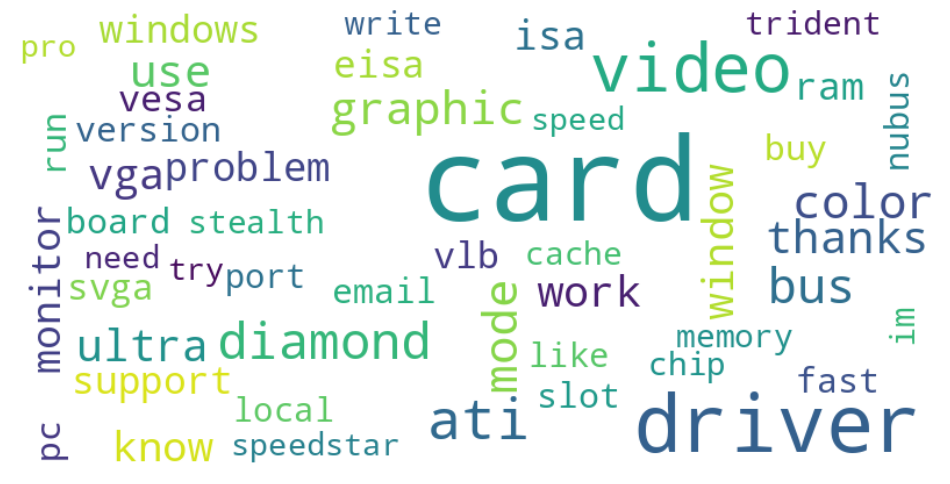

1


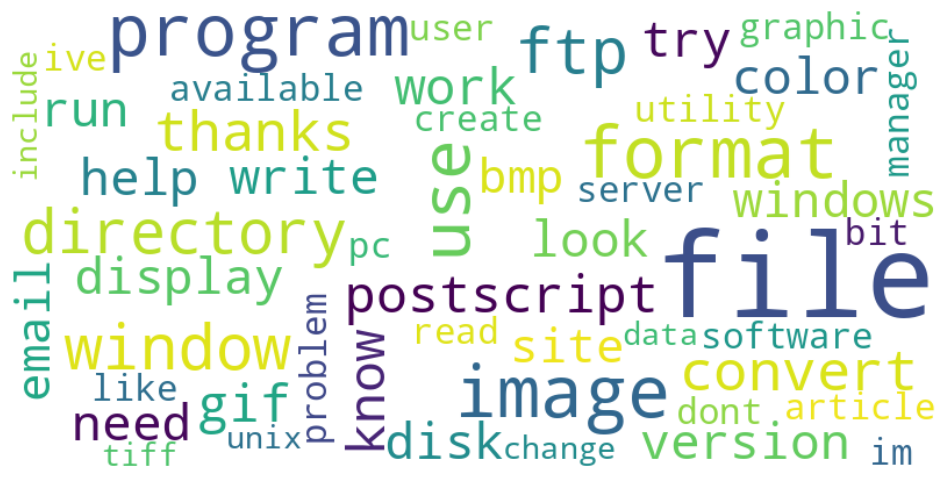

2


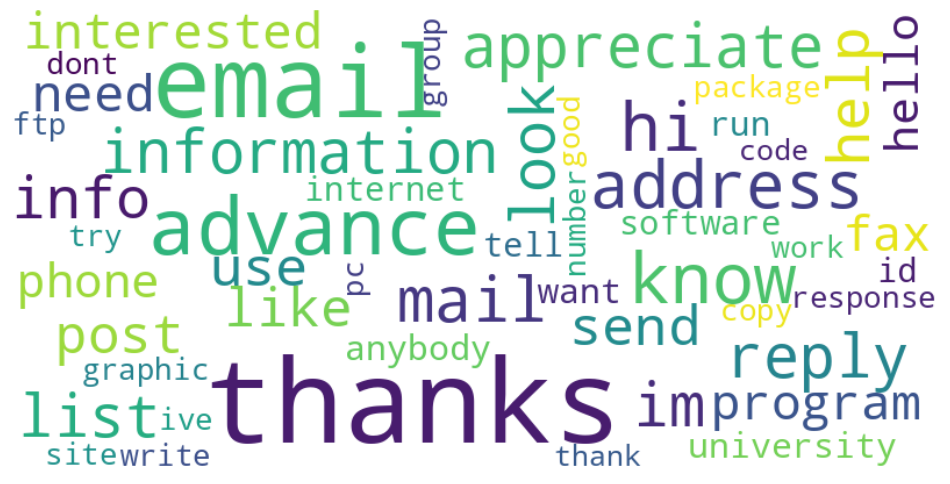

3


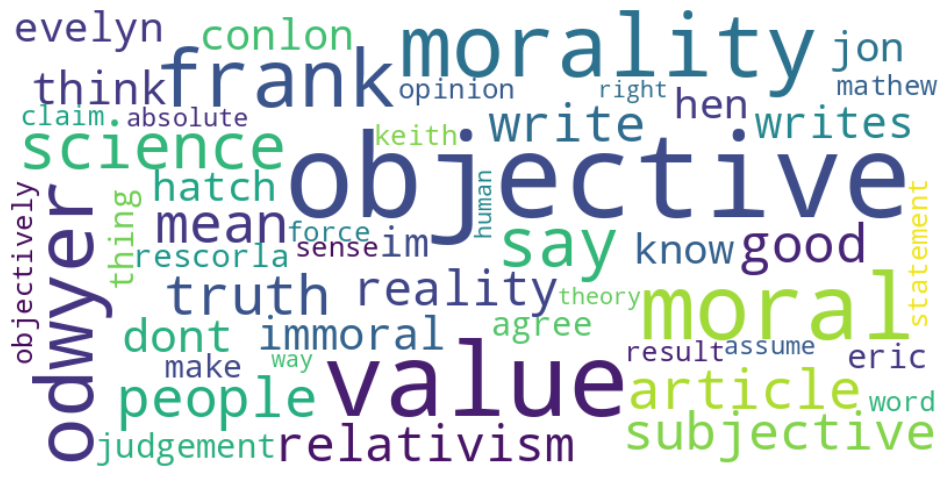

4


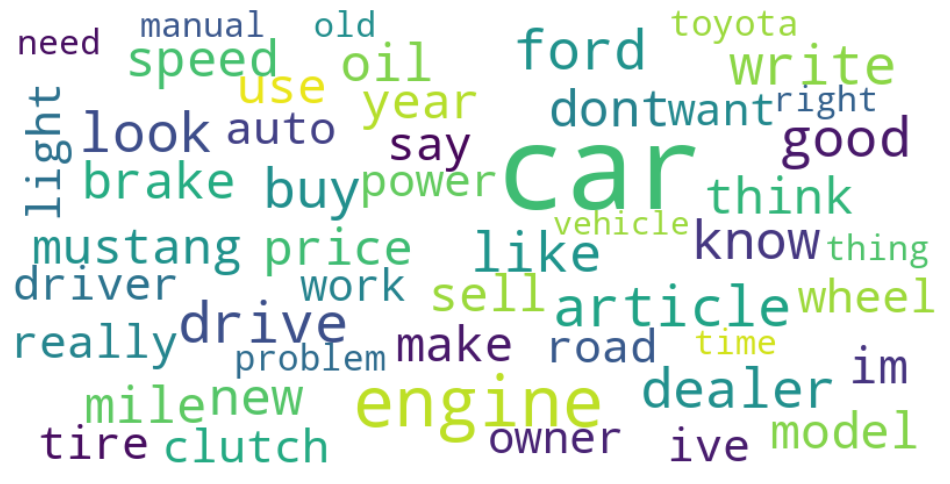

5


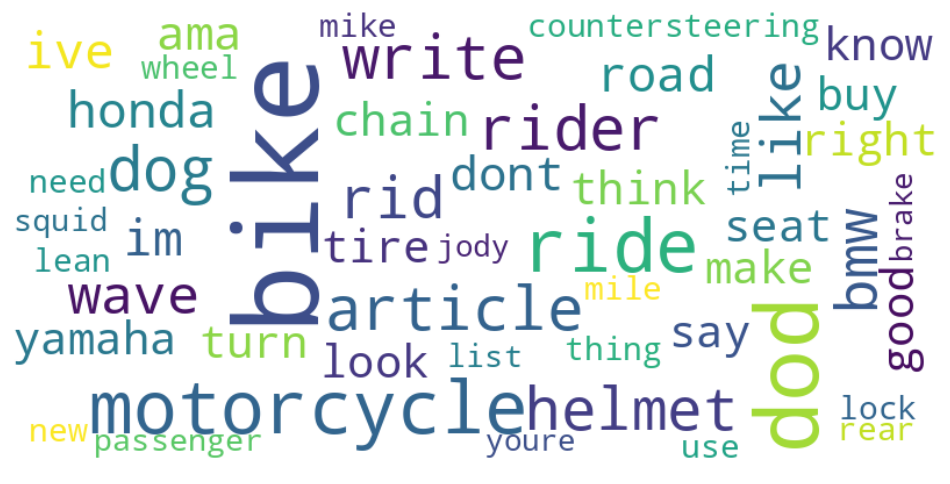

6


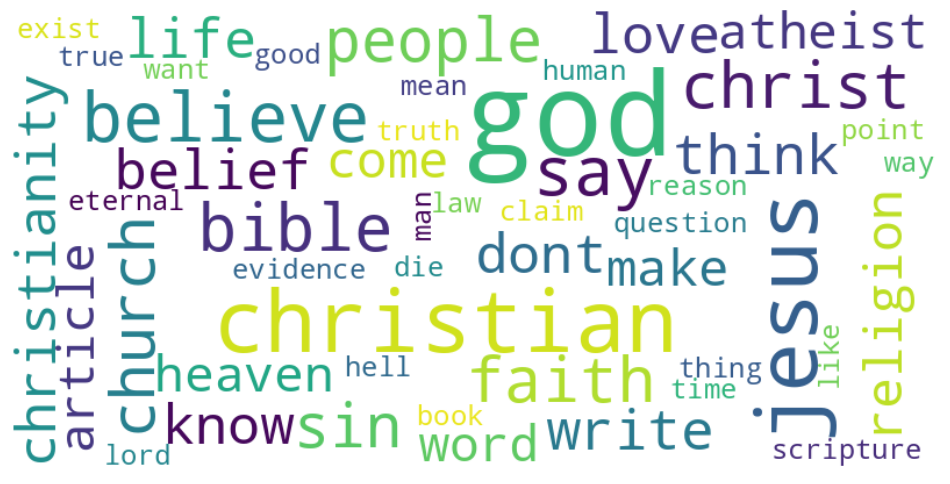

7


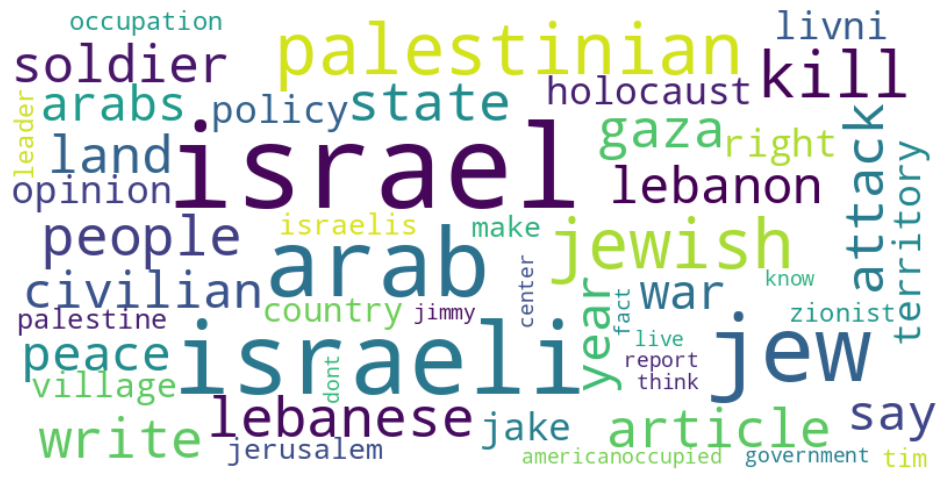

8


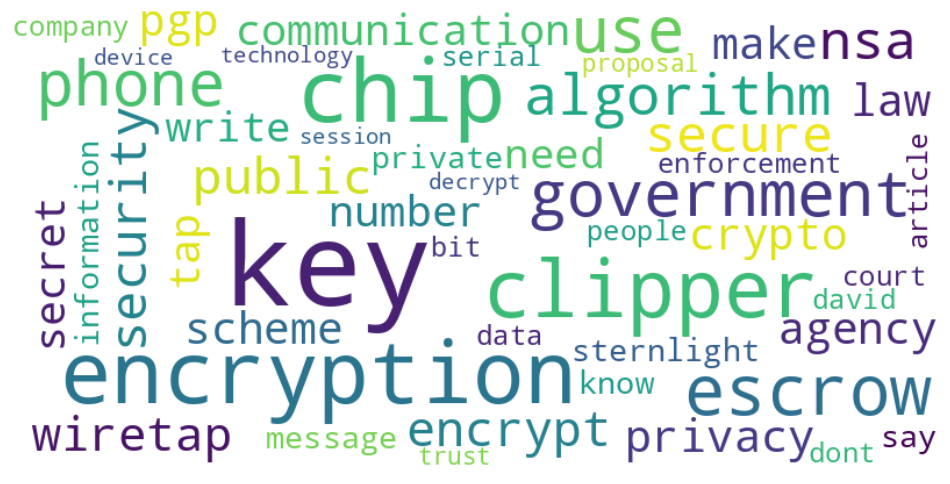

9


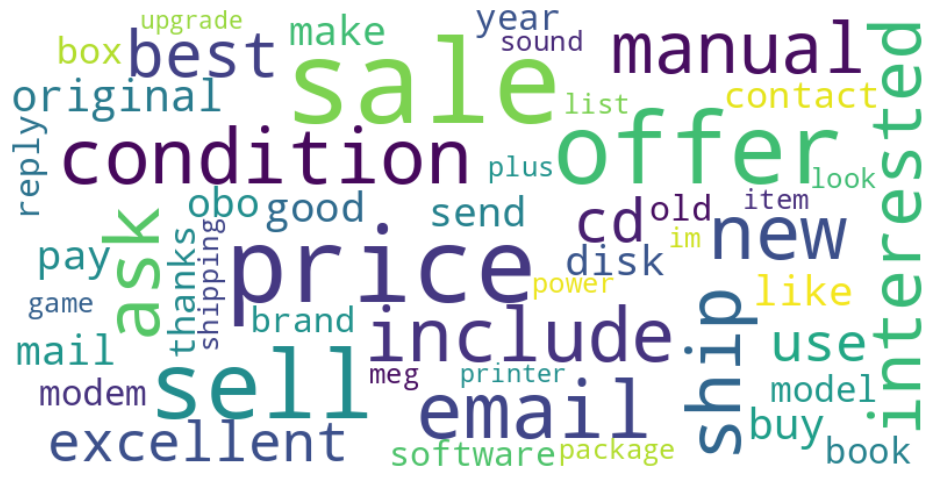

10


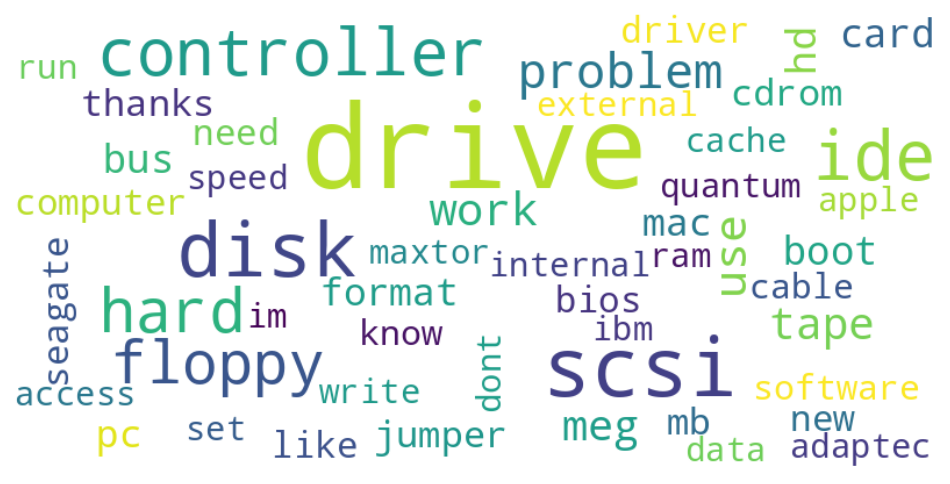

11


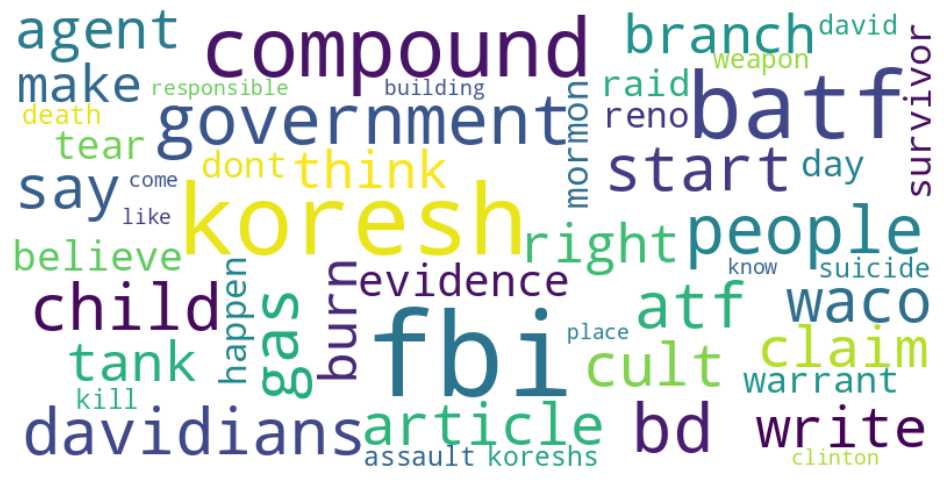

12


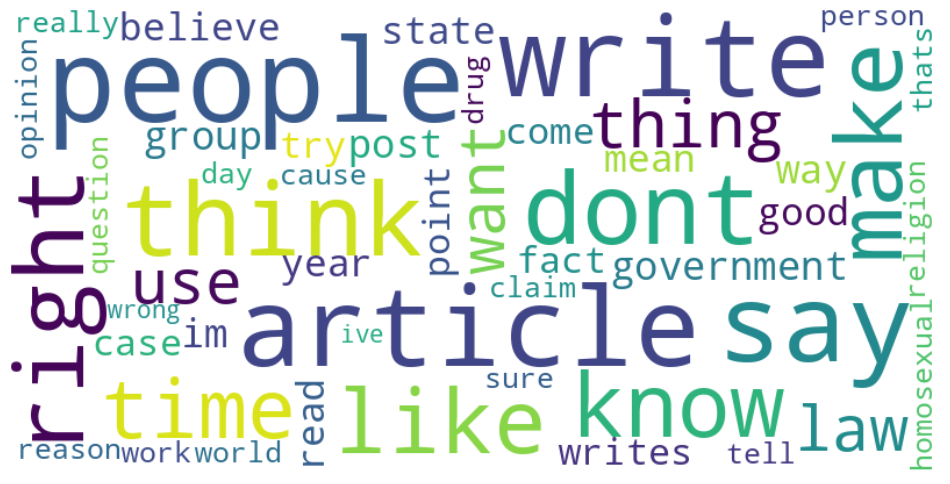

13


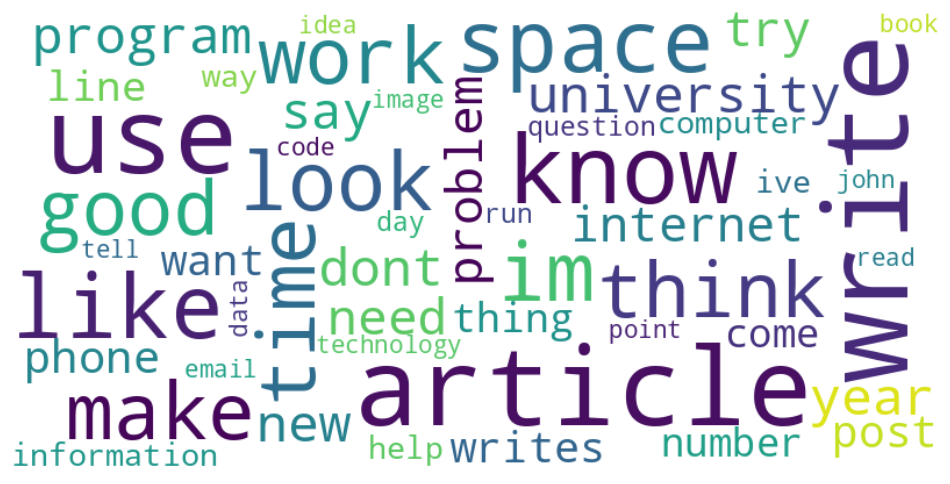

14


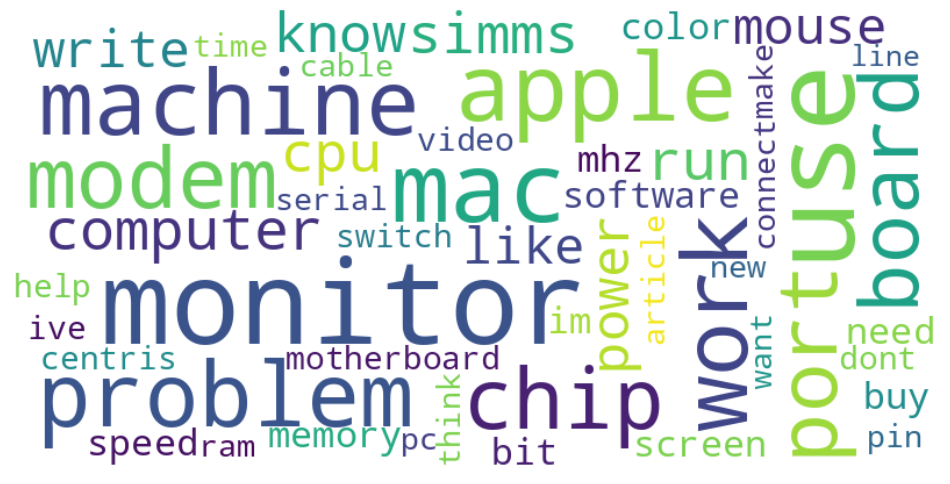

15


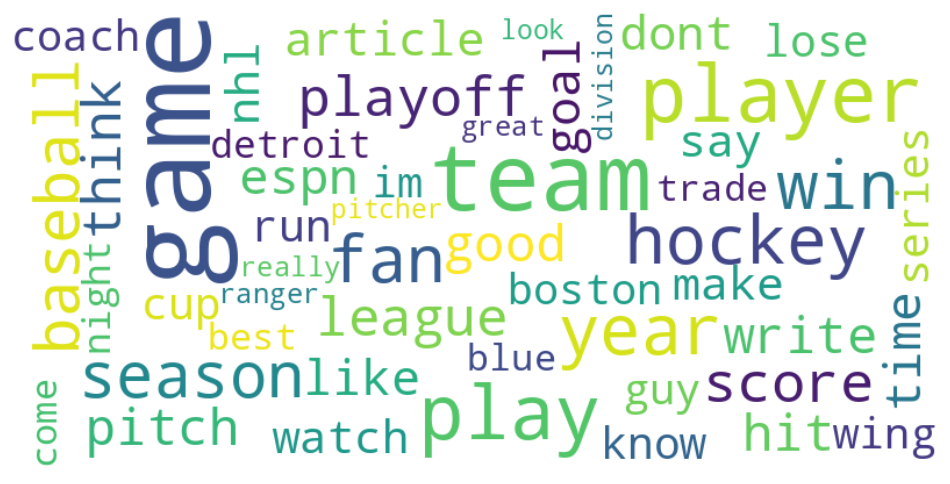

16


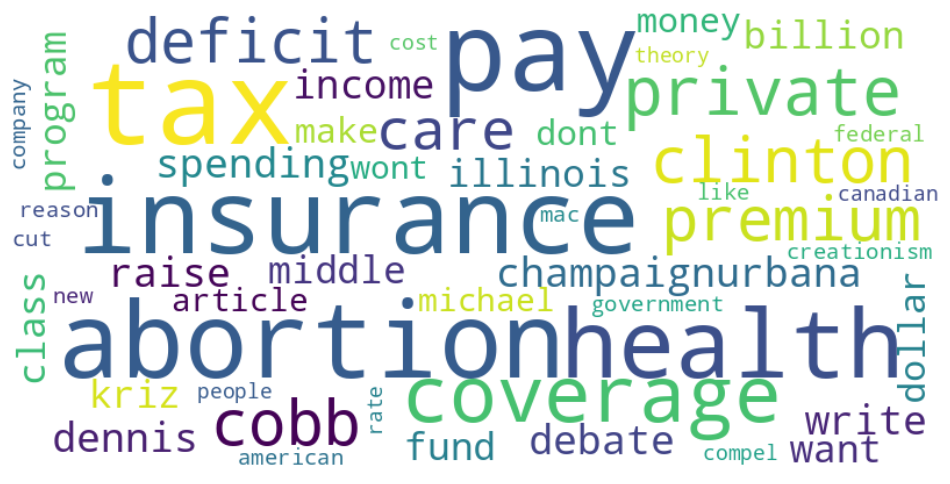

17


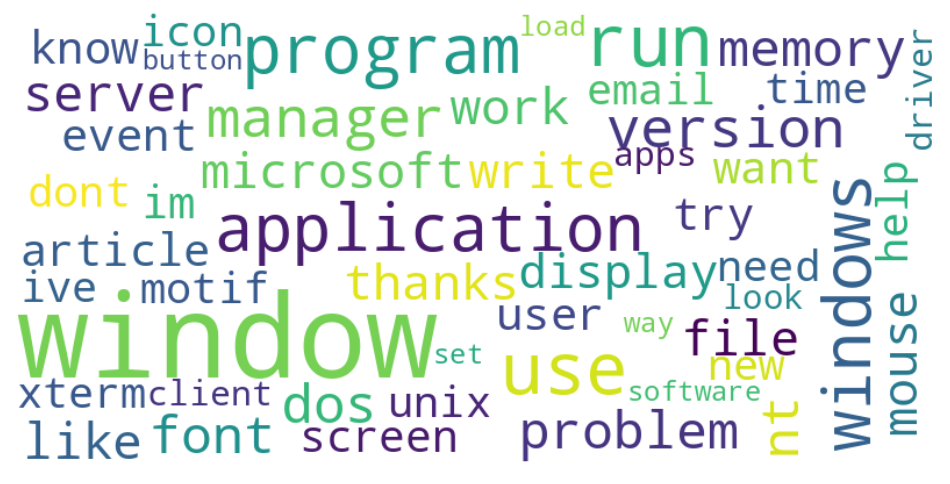

18


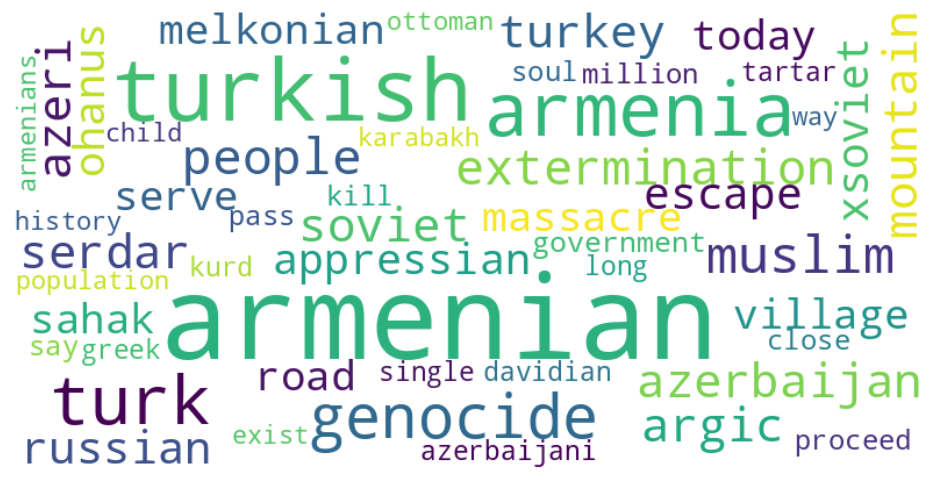

19


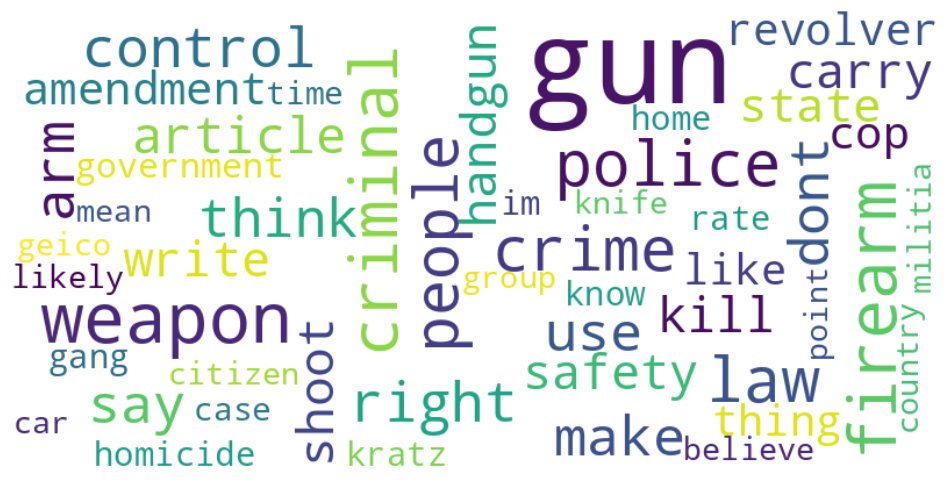

In [62]:
for i in range(20):
    freq = frequencies_dict(i, tfidf_km, km_centroids, km_terms)
    print(i)
    makeWordCloud(freq)

### Visualization of clusters

In [63]:
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
from sklearn.decomposition import TruncatedSVD
from sklearn.manifold import TSNE

def visualize_clusters(dataset, predictions, cmap_n):
    svd = TruncatedSVD(n_components=2, random_state=101)
    reduced_features = svd.fit_transform(dataset)

    plt.figure(figsize=(10, 6))
    scatter = plt.scatter(reduced_features[:, 0], reduced_features[:, 1], c=predictions, cmap=cmap_n)
    plt.xlabel('Component 1')
    plt.ylabel('Component 2')
    plt.title('Cluster Visualization')

    handles = [Patch(facecolor=scatter.cmap(scatter.norm(cluster)), label=f'Cluster {cluster}') for cluster in set(predictions)]

    plt.legend(handles=handles, title='Cluster', bbox_to_anchor=(1.04, 1), loc='upper left')
    plt.show()

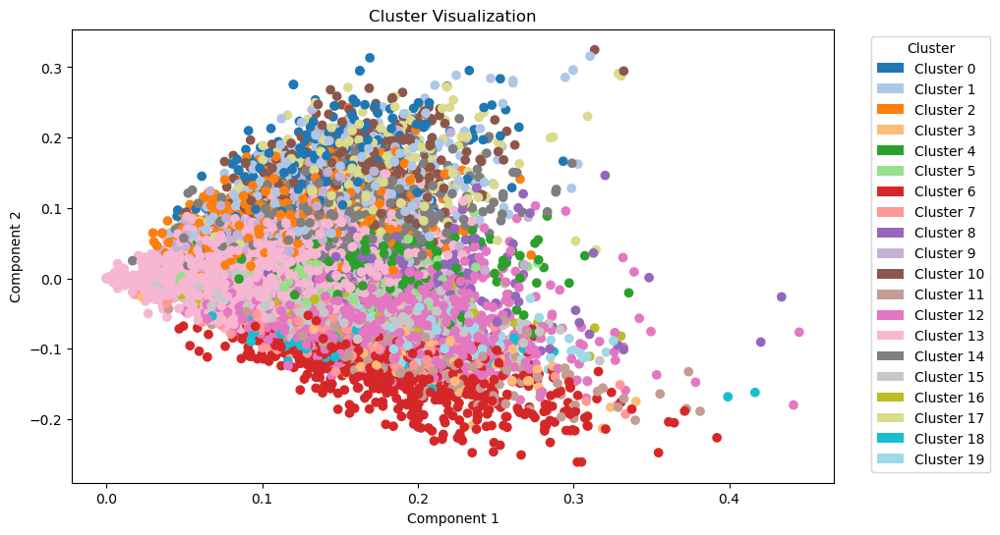

In [64]:
visualize_clusters(tfidf_df, tfidf_km.labels_, cmap_n='tab20')

### Confusion matrix

In [65]:
data_means_20 = df
labels_kmeans = tfidf_km.labels_
data_means_20['Cluster'] = labels_kmeans
data_means_20.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 13966 entries, 12727 to 19755
Data columns (total 27 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   text                     13966 non-null  object 
 1   newsgroup                13966 non-null  object 
 2   sentences                13966 non-null  int64  
 3   question_marks_ratio     13966 non-null  float64
 4   exclamation_marks_ratio  13966 non-null  float64
 5   links                    13966 non-null  int64  
 6   emails_addresses         13966 non-null  int64  
 7   chars                    13966 non-null  int64  
 8   capital_letters_ratio    13966 non-null  float64
 9   organizations_ratio      13966 non-null  float64
 10  money_ratio              13966 non-null  float64
 11  person_ratio             13966 non-null  float64
 12  company_ratio            13966 non-null  float64
 13  gpe_ratio                13966 non-null  float64
 14  date_ratio        

/tmp/ipykernel_26088/3953939782.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_means_20['Cluster'] = labels_kmeans


In [66]:
data_means_20

,text,newsgroup,sentences,question_marks_ratio,exclamation_marks_ratio,links,emails_addresses,chars,capital_letters_ratio,organizations_ratio,...,verb_ratio,adv_ratio,words,unique_words,lexical_div,avg_word_length,negative,positive,neutral,Cluster
12727,article robert castro writes would anyone dodl...,rec.motorcycles,14,0.071429,0.571429,0,3,1335,0.058878,0.008989,...,0.218978,0.051095,137,117,1.170940,9.744526,0.033,0.139,0.828,9
12958,article jerry hartzler cat write article micha...,rec.motorcycles,5,0.000000,0.000000,0,5,402,0.072508,0.007463,...,0.205128,0.102564,39,36,1.083333,10.307692,0.068,0.093,0.839,5
17116,try unsubscribe group send email doesnt work c...,comp.windows.x,4,0.250000,0.000000,0,1,397,0.081818,0.035264,...,0.142857,0.023810,42,40,1.050000,9.452381,0.027,0.107,0.867,2
6186,article john eaton write thats one problem far...,sci.crypt,13,0.230769,0.000000,0,2,1334,0.018051,0.000000,...,0.191667,0.058333,120,109,1.100917,11.116667,0.129,0.218,0.653,8
6782,key question whether nonclipper encryption mak...,sci.crypt,16,0.125000,0.000000,0,1,1906,0.018657,0.005771,...,0.242604,0.053254,169,134,1.261194,11.278107,0.120,0.231,0.649,8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11051,price seem good would like know give away secr...,comp.sys.mac.hardware,5,0.000000,0.000000,0,0,258,0.110577,0.000000,...,0.333333,0.041667,24,23,1.043478,10.750000,0.000,0.273,0.727,13
17409,get compwindowsx justin kibell system programm...,comp.windows.x,4,0.250000,0.000000,0,1,195,0.136095,0.051282,...,0.150000,0.000000,20,20,1.000000,9.750000,0.000,0.000,1.000,13
8032,watch detroitminnesota game last night think s...,rec.sport.hockey,5,0.400000,0.400000,0,2,251,0.053398,0.019920,...,0.240000,0.000000,25,23,1.086957,10.040000,0.000,0.087,0.913,15
13540,article jon livesey write article douglas grah...,alt.atheism,17,0.058824,0.000000,0,5,2611,0.045057,0.012256,...,0.212500,0.050000,240,186,1.290323,10.879167,0.077,0.210,0.713,12


In [67]:
import pandas as pd

def calculate_cluster_ratio(df):
    grouped_df = df.groupby(['newsgroup', 'Cluster']).size().reset_index(name='count')

    total_counts = grouped_df.groupby('Cluster')['count'].transform('sum')

    grouped_df['ratio'] = grouped_df['count'] / total_counts * 100

    return grouped_df

In [68]:
df_matrix = calculate_cluster_ratio(data_means_20)

In [69]:
df_matrix

,newsgroup,Cluster,count,ratio
0,alt.atheism,1,4,0.963855
1,alt.atheism,2,4,0.440529
2,alt.atheism,3,99,52.380952
3,alt.atheism,4,4,0.865801
4,alt.atheism,6,153,21.132597
...,...,...,...,...
203,talk.religion.misc,11,80,22.099448
204,talk.religion.misc,12,194,8.490153
205,talk.religion.misc,13,124,3.292618
206,talk.religion.misc,16,42,30.434783


In [70]:
import pandas as pd
import itertools

def calculate_cluster_ratio(df):
    unique_combinations = pd.DataFrame(list(itertools.product(df['newsgroup'].unique(), df['Cluster'].unique())), columns=['newsgroup', 'Cluster'])

    grouped_df = df.groupby(['newsgroup', 'Cluster']).size().reset_index(name='count')

    total_counts = grouped_df.groupby('Cluster')['count'].transform('sum')

    grouped_df['ratio'] = grouped_df['count'] / total_counts * 100

    result_df = unique_combinations.merge(grouped_df, on=['newsgroup', 'Cluster'], how='left')

    result_df['ratio'].fillna(0, inplace=True)

    return result_df


In [71]:
kmeans_df_matrix_20 = calculate_cluster_ratio(data_means_20)

In [72]:
kmeans_df_matrix_20

,newsgroup,Cluster,count,ratio
0,rec.motorcycles,9,15.0,2.906977
1,rec.motorcycles,5,417.0,99.049881
2,rec.motorcycles,2,10.0,1.101322
3,rec.motorcycles,8,NaN,0.000000
4,rec.motorcycles,12,55.0,2.407002
...,...,...,...,...
395,sci.electronics,7,NaN,0.000000
396,sci.electronics,0,10.0,3.472222
397,sci.electronics,16,NaN,0.000000
398,sci.electronics,3,NaN,0.000000


In [73]:
import seaborn as sns

def draw_ratio_heatmap(data_frame):
    heatmap_data = data_frame.pivot(columns='Cluster', index='newsgroup', values='ratio')

    fig, ax = plt.subplots(figsize=(10, 6))
    sns.heatmap(heatmap_data, annot=True, fmt=".2f", cmap='viridis', cbar=True, ax=ax)

    ax.set_title('Ratio Heatmap')
    ax.set_xlabel('Clusters')
    ax.set_ylabel('Newsgroups')

    #num_clusters = heatmap_data.shape[1]
    #if num_clusters == 7:
    #    current_dir = os.getcwd()
    #    filename = "heatmap_7.png"
    #    save_path = os.path.join(current_dir, filename)
    #    plt.savefig(save_path, dpi=300, bbox_inches='tight')

    plt.tight_layout()
    plt.show()



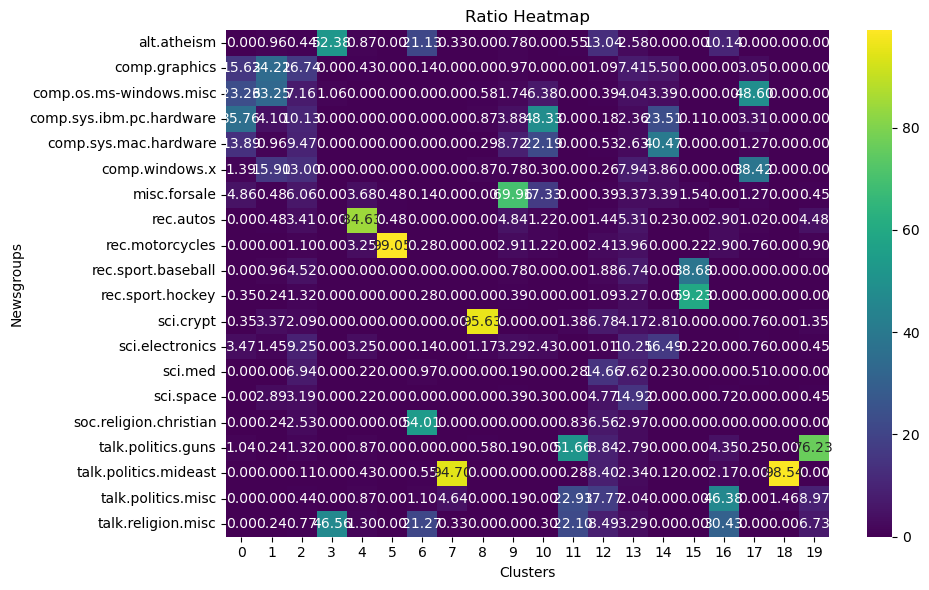

In [74]:
draw_ratio_heatmap(kmeans_df_matrix_20)

# Clustering for less number of clusters

# 10 clusters

In [75]:
kmeans_10 = kmeans(tfidf_df, 10)

Within-cluster sum of squares: -13356.519
Silhouette Score: 0.006
Calinski Harabasz Score: 38.918
Davies Bouldin: 9.791
Homogeneity: 0.304


In [76]:
km_centroids_10, km_terms_10= print_most_relevant_terms(kmeans_10, tfidf_vectorizer, 10)

Cluster 0: thanks email use know im look like advance help send
Cluster 1: game team player play year hockey win fan season baseball
Cluster 2: card driver video ati monitor diamond bus graphic use color
Cluster 3: drive scsi disk ide controller hard floppy use mac problem
Cluster 4: people right say government gun article write think make dont
Cluster 5: write article know say use think dont like make time
Cluster 6: window file program use run windows application display image server
Cluster 7: car bike engine article write good look like drive buy
Cluster 8: key encryption chip clipper escrow government use phone nsa algorithm
Cluster 9: god christian jesus say believe church bible christ people faith


In [77]:
count_rows_in_clusters(kmeans_10.labels_)

array([2424,  916,  326,  387, 1837, 5226,  910,  725,  376,  839])

0


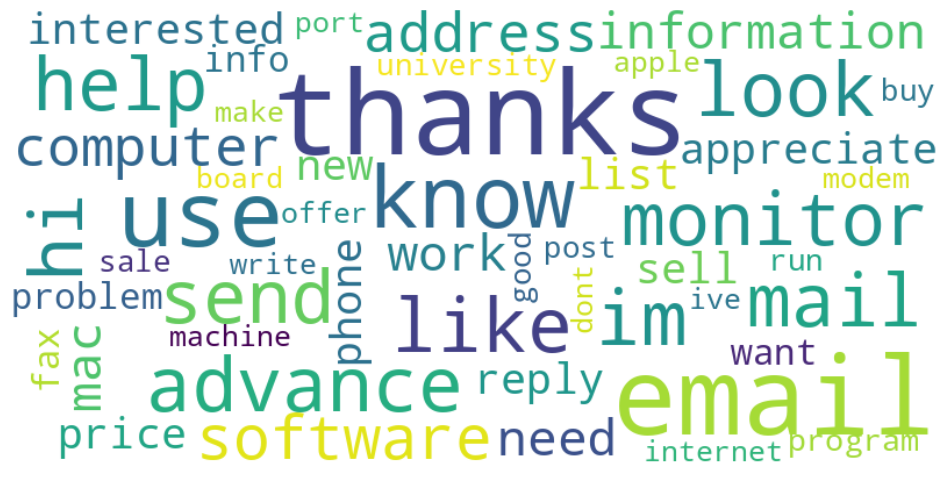

1


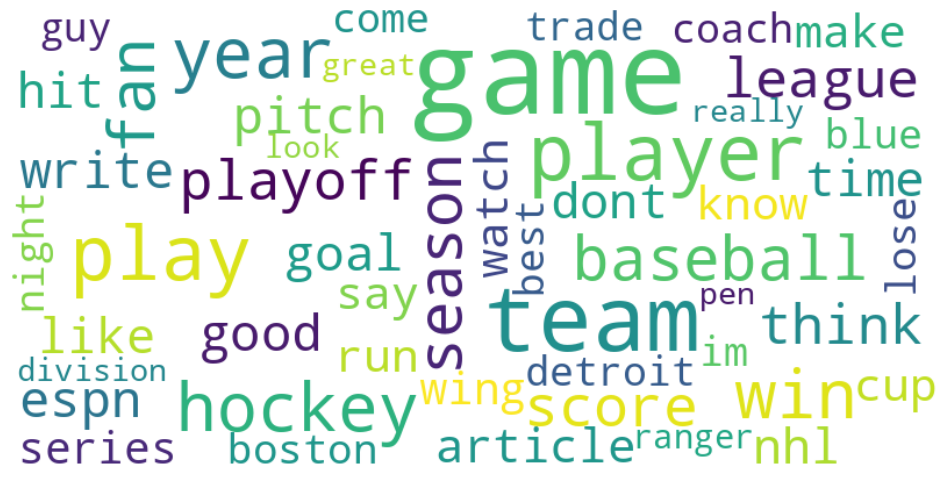

2


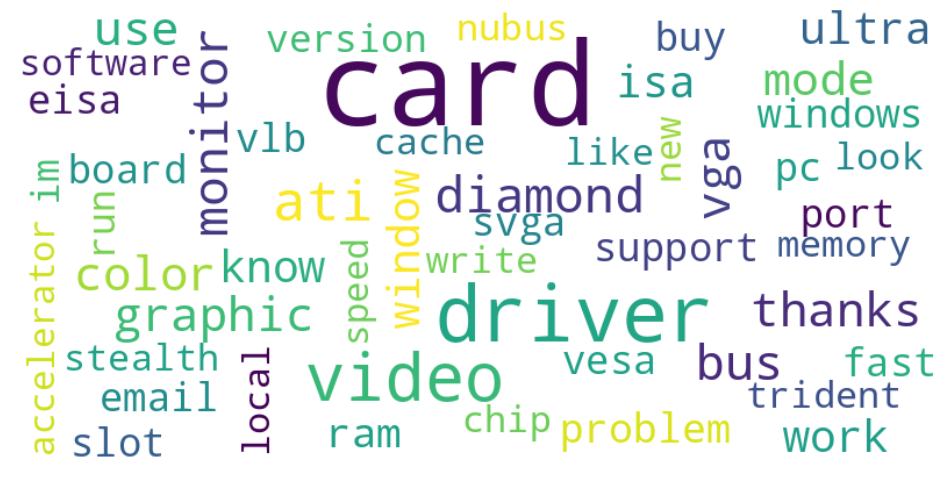

3


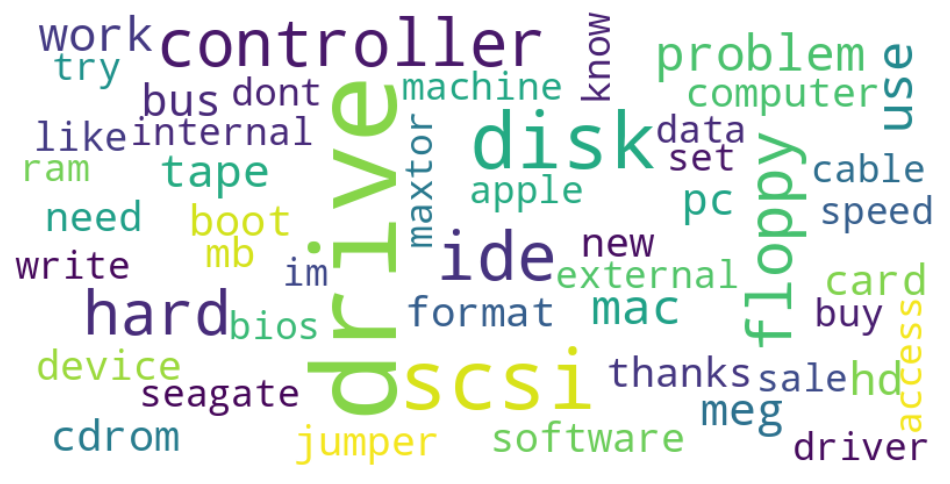

4


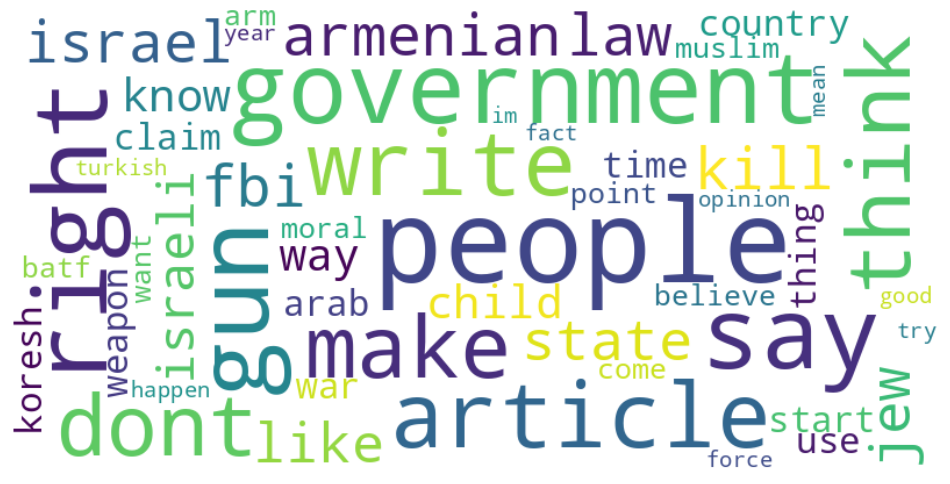

5


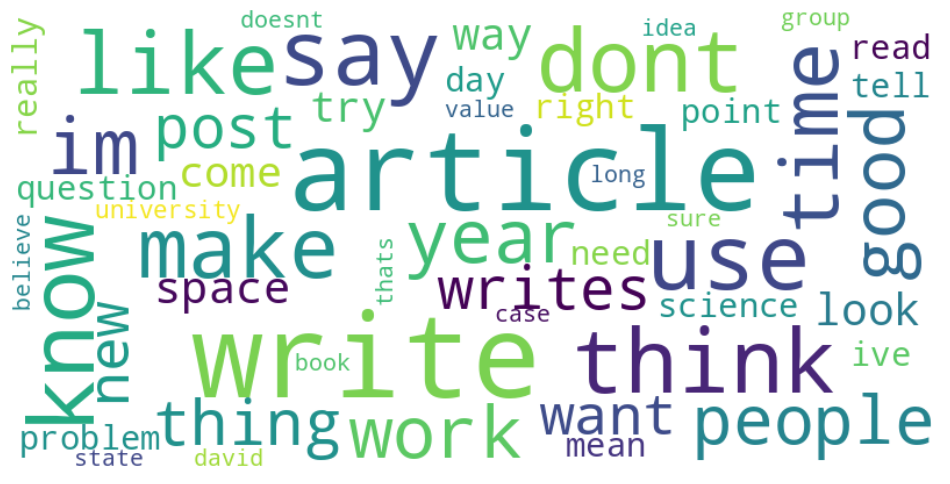

6


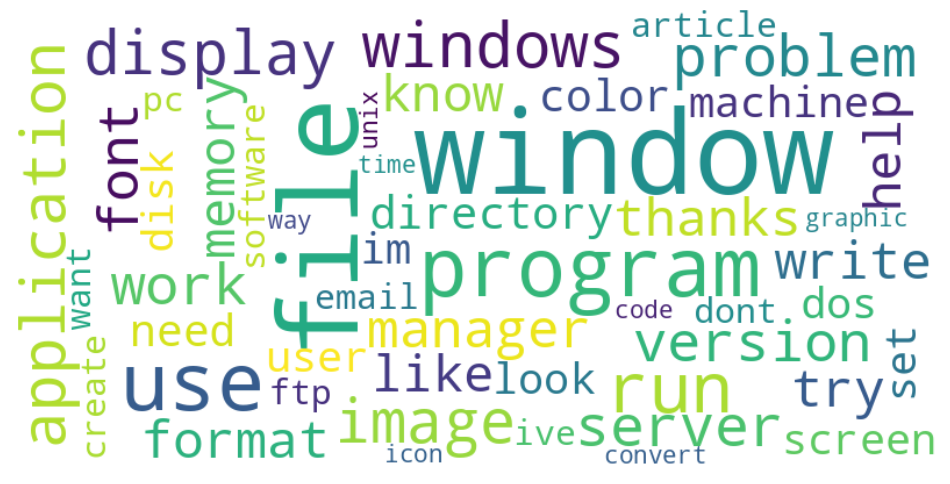

7


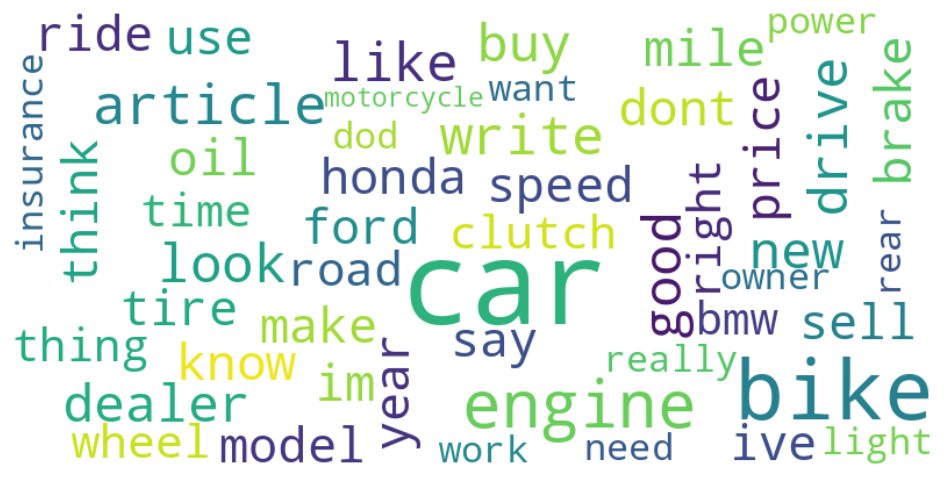

8


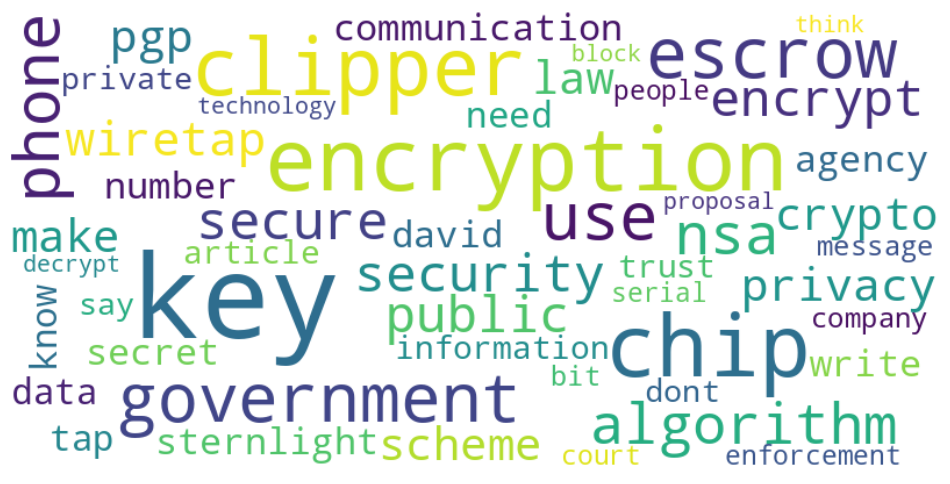

9


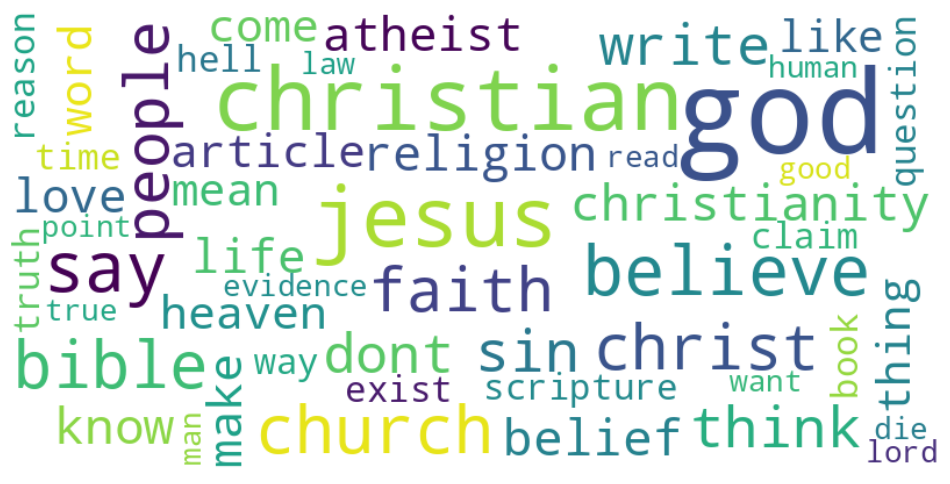

In [78]:
for i in range(10):
    freq = frequencies_dict(i, kmeans_10, km_centroids_10, km_terms_10)
    print(i)
    makeWordCloud(freq)

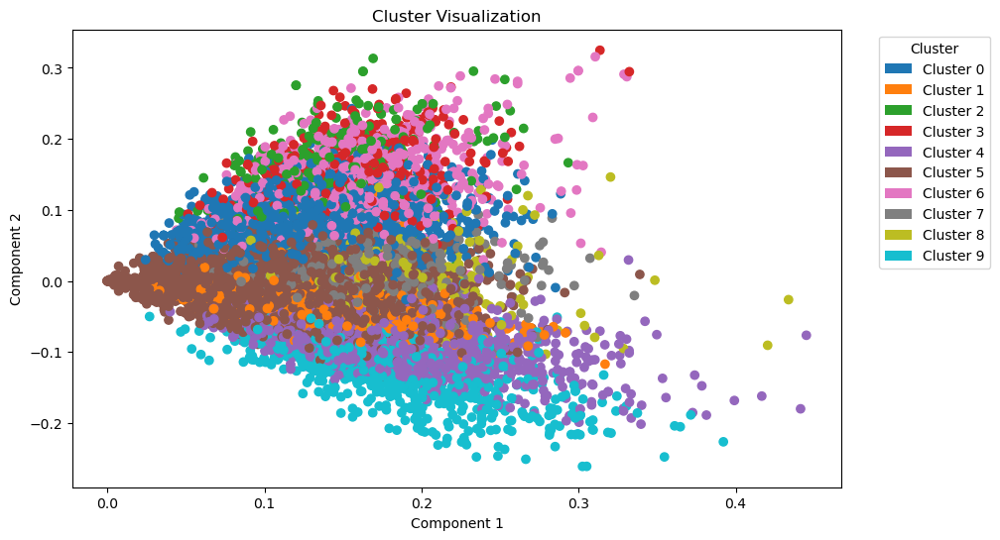

In [79]:
visualize_clusters(tfidf_df, kmeans_10.labels_, cmap_n='tab10')

### Confusion matrix

In [80]:
data_means_10 = df
labels_kmeans_10 = kmeans_10.labels_
data_means_10['Cluster'] = labels_kmeans_10
data_means_10.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 13966 entries, 12727 to 19755
Data columns (total 27 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   text                     13966 non-null  object 
 1   newsgroup                13966 non-null  object 
 2   sentences                13966 non-null  int64  
 3   question_marks_ratio     13966 non-null  float64
 4   exclamation_marks_ratio  13966 non-null  float64
 5   links                    13966 non-null  int64  
 6   emails_addresses         13966 non-null  int64  
 7   chars                    13966 non-null  int64  
 8   capital_letters_ratio    13966 non-null  float64
 9   organizations_ratio      13966 non-null  float64
 10  money_ratio              13966 non-null  float64
 11  person_ratio             13966 non-null  float64
 12  company_ratio            13966 non-null  float64
 13  gpe_ratio                13966 non-null  float64
 14  date_ratio        

/tmp/ipykernel_26088/4201433013.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_means_10['Cluster'] = labels_kmeans_10


In [81]:
data_means_10

,text,newsgroup,sentences,question_marks_ratio,exclamation_marks_ratio,links,emails_addresses,chars,capital_letters_ratio,organizations_ratio,...,verb_ratio,adv_ratio,words,unique_words,lexical_div,avg_word_length,negative,positive,neutral,Cluster
12727,article robert castro writes would anyone dodl...,rec.motorcycles,14,0.071429,0.571429,0,3,1335,0.058878,0.008989,...,0.218978,0.051095,137,117,1.170940,9.744526,0.033,0.139,0.828,0
12958,article jerry hartzler cat write article micha...,rec.motorcycles,5,0.000000,0.000000,0,5,402,0.072508,0.007463,...,0.205128,0.102564,39,36,1.083333,10.307692,0.068,0.093,0.839,5
17116,try unsubscribe group send email doesnt work c...,comp.windows.x,4,0.250000,0.000000,0,1,397,0.081818,0.035264,...,0.142857,0.023810,42,40,1.050000,9.452381,0.027,0.107,0.867,0
6186,article john eaton write thats one problem far...,sci.crypt,13,0.230769,0.000000,0,2,1334,0.018051,0.000000,...,0.191667,0.058333,120,109,1.100917,11.116667,0.129,0.218,0.653,8
6782,key question whether nonclipper encryption mak...,sci.crypt,16,0.125000,0.000000,0,1,1906,0.018657,0.005771,...,0.242604,0.053254,169,134,1.261194,11.278107,0.120,0.231,0.649,8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11051,price seem good would like know give away secr...,comp.sys.mac.hardware,5,0.000000,0.000000,0,0,258,0.110577,0.000000,...,0.333333,0.041667,24,23,1.043478,10.750000,0.000,0.273,0.727,5
17409,get compwindowsx justin kibell system programm...,comp.windows.x,4,0.250000,0.000000,0,1,195,0.136095,0.051282,...,0.150000,0.000000,20,20,1.000000,9.750000,0.000,0.000,1.000,0
8032,watch detroitminnesota game last night think s...,rec.sport.hockey,5,0.400000,0.400000,0,2,251,0.053398,0.019920,...,0.240000,0.000000,25,23,1.086957,10.040000,0.000,0.087,0.913,1
13540,article jon livesey write article douglas grah...,alt.atheism,17,0.058824,0.000000,0,5,2611,0.045057,0.012256,...,0.212500,0.050000,240,186,1.290323,10.879167,0.077,0.210,0.713,4


In [82]:
df_matrix_10 = calculate_cluster_ratio(data_means_10)

In [83]:
df_matrix_10

,newsgroup,Cluster,count,ratio
0,rec.motorcycles,0,35.0,1.443894
1,rec.motorcycles,5,420.0,8.036739
2,rec.motorcycles,8,NaN,0.000000
3,rec.motorcycles,6,1.0,0.109890
4,rec.motorcycles,4,12.0,0.653239
...,...,...,...,...
195,sci.electronics,7,19.0,2.620690
196,sci.electronics,1,3.0,0.327511
197,sci.electronics,9,1.0,0.119190
198,sci.electronics,3,9.0,2.325581


In [84]:
kmeans_df_matrix_10 = calculate_cluster_ratio(data_means_10)

In [85]:
kmeans_df_matrix_10

,newsgroup,Cluster,count,ratio
0,rec.motorcycles,0,35.0,1.443894
1,rec.motorcycles,5,420.0,8.036739
2,rec.motorcycles,8,NaN,0.000000
3,rec.motorcycles,6,1.0,0.109890
4,rec.motorcycles,4,12.0,0.653239
...,...,...,...,...
195,sci.electronics,7,19.0,2.620690
196,sci.electronics,1,3.0,0.327511
197,sci.electronics,9,1.0,0.119190
198,sci.electronics,3,9.0,2.325581


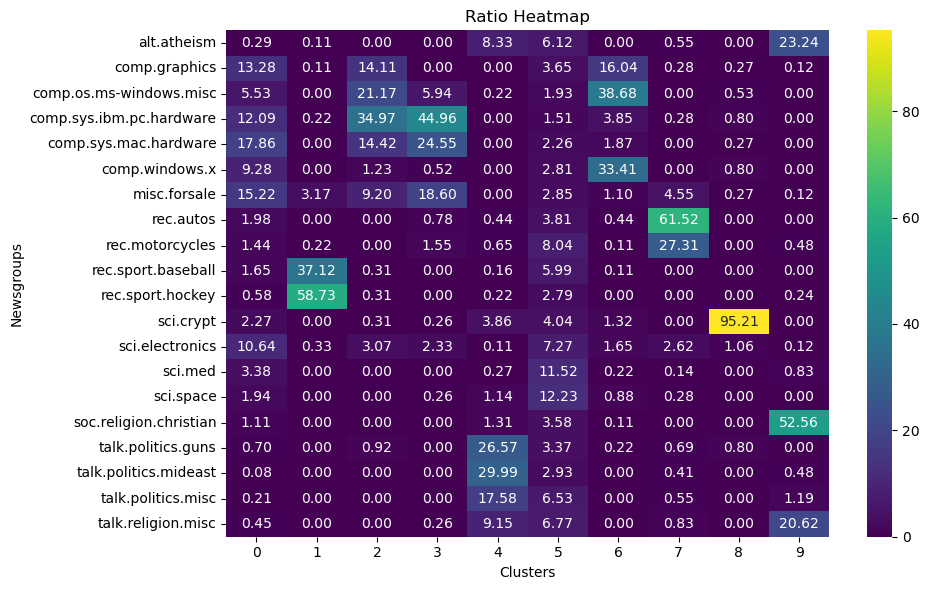

In [86]:
draw_ratio_heatmap(kmeans_df_matrix_10)

# 9 clusters

In [87]:
kmeans_9 = kmeans(tfidf_df, 9)

Within-cluster sum of squares: -13384.140
Silhouette Score: 0.006
Calinski Harabasz Score: 40.095
Davies Bouldin: 10.307
Homogeneity: 0.306


In [88]:
km_centroids_9, km_terms_9= print_most_relevant_terms(kmeans_9, tfidf_vectorizer, 9)

Cluster 0: car engine drive article dealer look write buy good like
Cluster 1: people government right gun say article write make armenian israel
Cluster 2: card drive scsi disk driver controller ide bus use floppy
Cluster 3: window file use program run windows application problem display server
Cluster 4: write article use know think say like dont make time
Cluster 5: key encryption chip clipper escrow government use phone nsa algorithm
Cluster 6: game team player play year hockey win fan baseball season
Cluster 7: god christian jesus say believe people objective bible write think
Cluster 8: thanks email use know im look advance like help hi


In [89]:
count_rows_in_clusters(kmeans_9.labels_)

array([ 508, 1830,  693,  930, 5259,  375,  927, 1104, 2340])

0


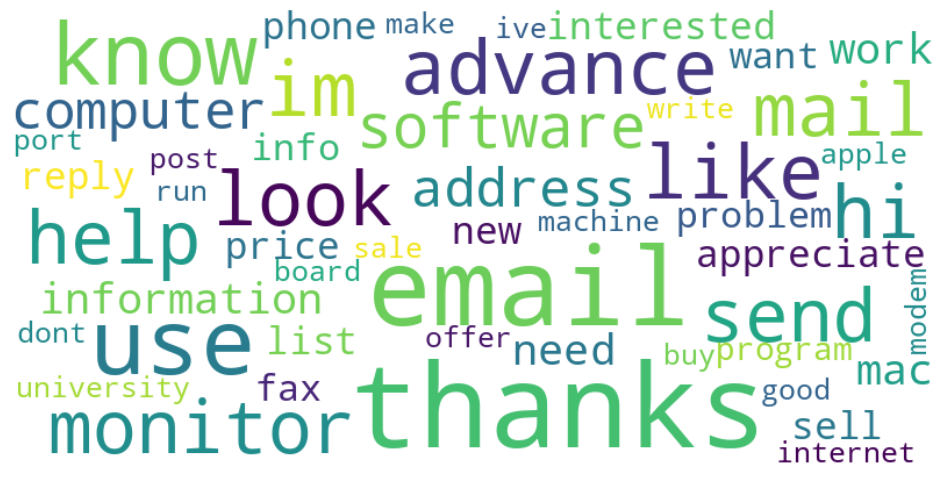

1


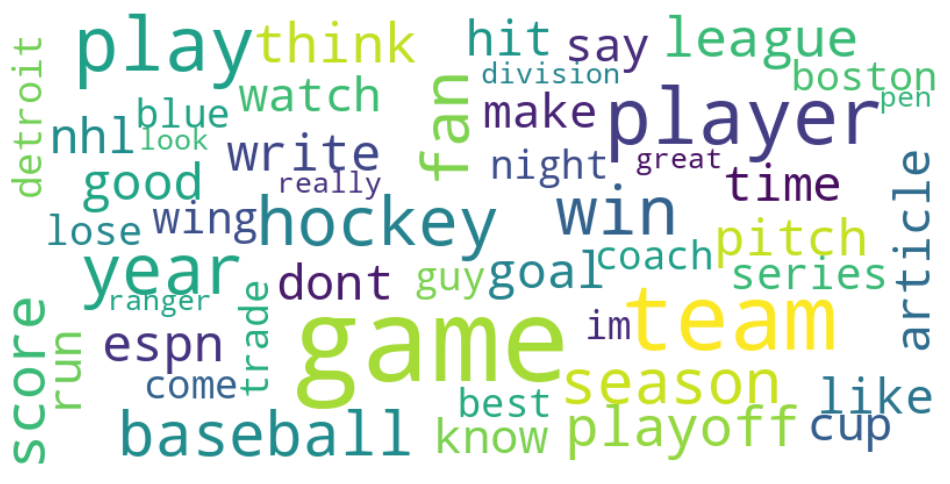

2


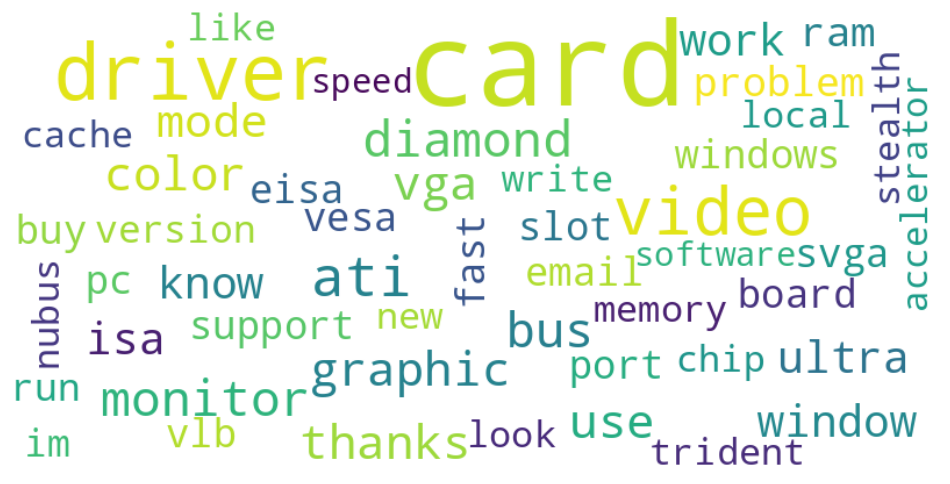

3


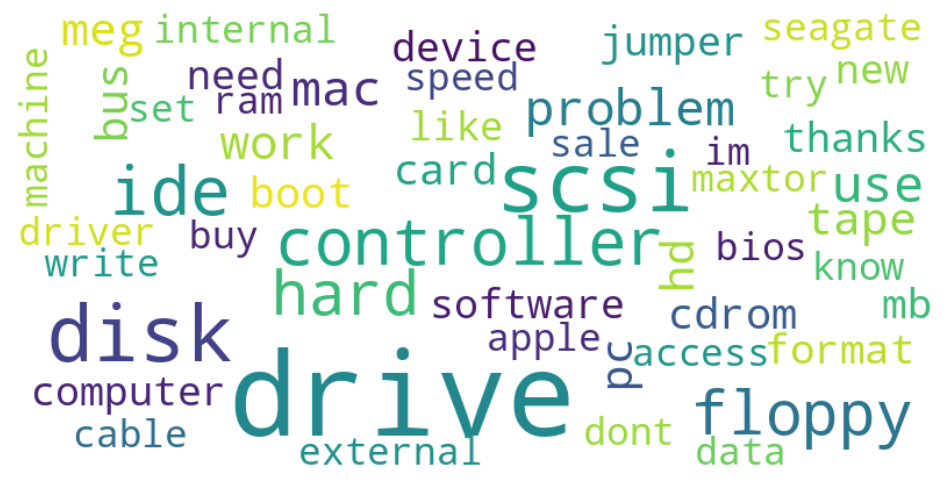

4


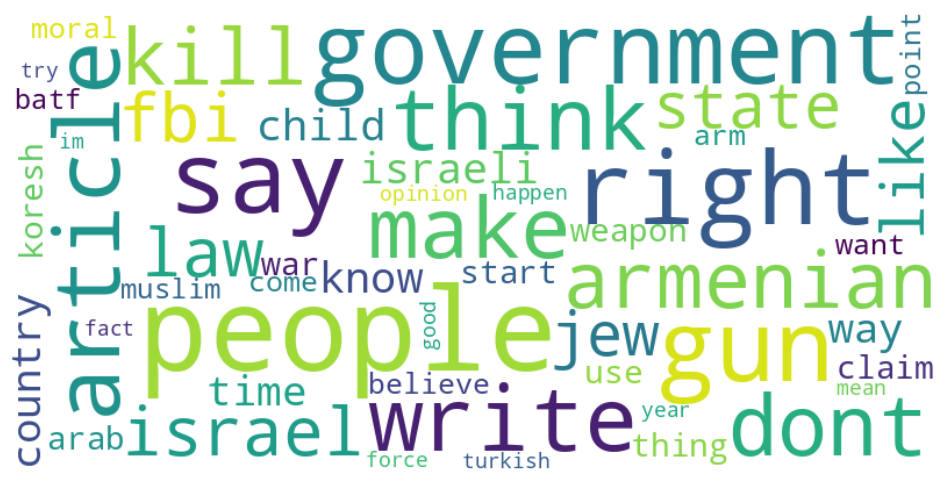

5


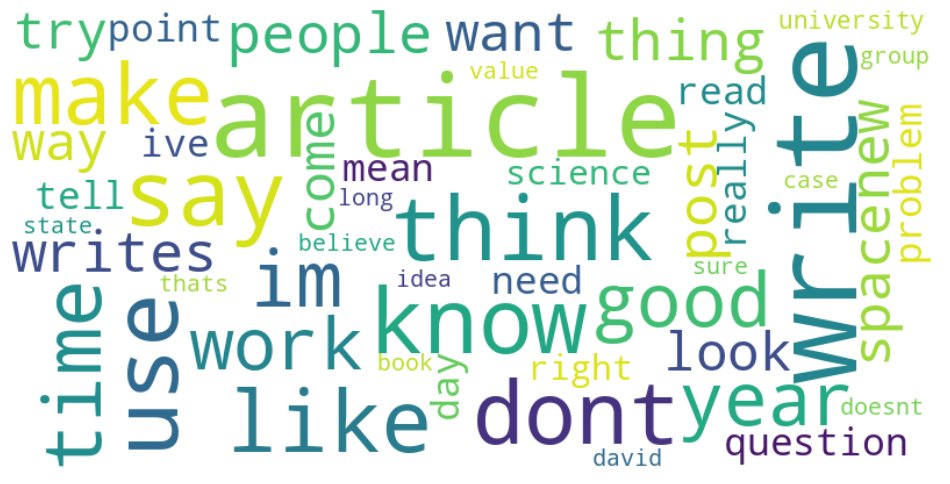

6


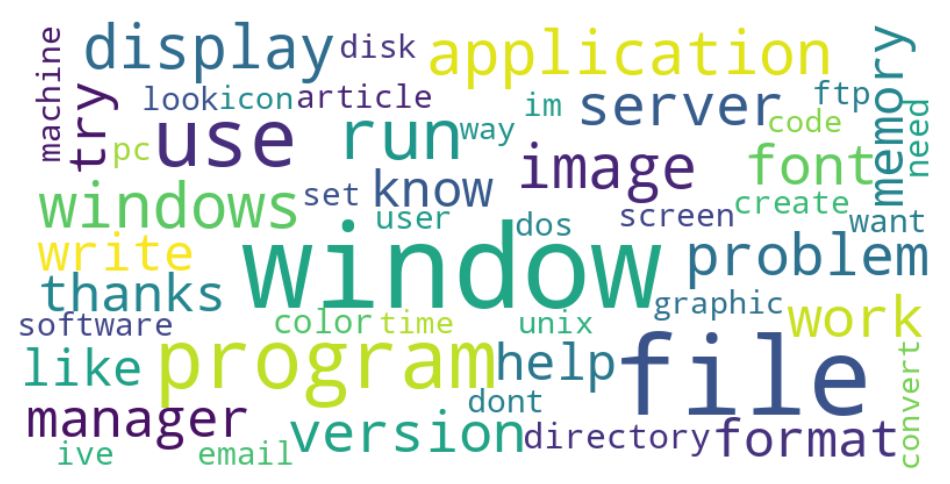

7


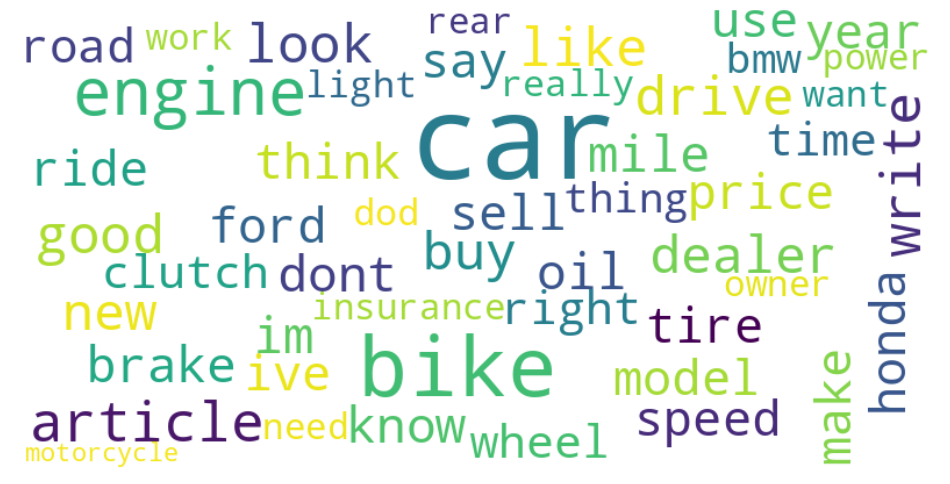

8


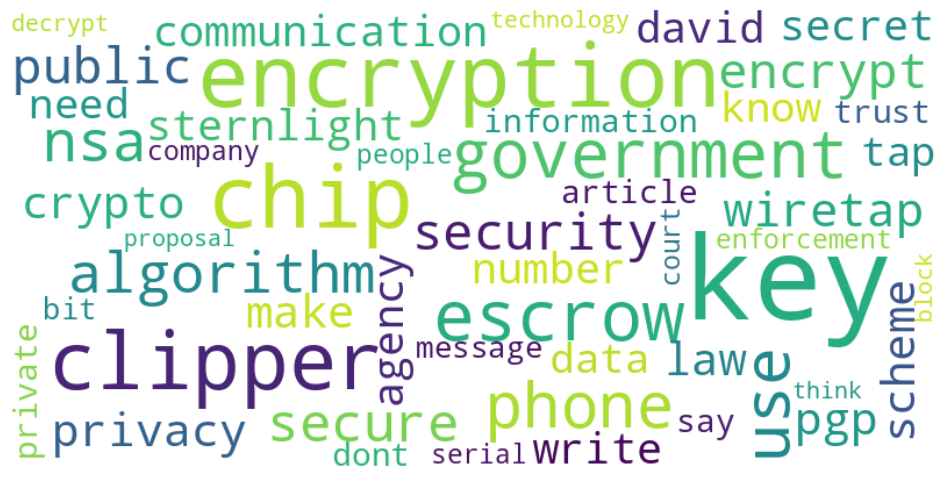

In [90]:
for i in range(9):
    freq = frequencies_dict(i, kmeans_10, km_centroids_10, km_terms_10)
    print(i)
    makeWordCloud(freq)

In [91]:
import matplotlib.pyplot as plt
from matplotlib.patches import Patch
from sklearn.decomposition import TruncatedSVD
from sklearn.manifold import TSNE

def visualize_clusters(dataset, predictions, n_clusters):

    svd = TruncatedSVD(n_components=2, random_state=101)
    reduced_features = svd.fit_transform(dataset)

    plt.figure(figsize=(10, 6))
    scatter = plt.scatter(reduced_features[:, 0], reduced_features[:, 1], c=predictions, cmap='tab10', vmin=0, vmax=n_clusters-1)
    plt.xlabel('Component 1')
    plt.ylabel('Component 2')
    plt.title('Cluster Visualization')

    handles = [Patch(facecolor=scatter.cmap(scatter.norm(cluster)), label=f'Cluster {cluster}') for cluster in set(predictions)]

    plt.legend(handles=handles, title='Cluster', bbox_to_anchor=(1.04, 1), loc='upper left')

    #if(n_clusters == 7):
    #    current_dir = os.getcwd()
    #    filename = "cluster_visualization_7.png"

    #    save_path = os.path.join(current_dir, filename)
    #    plt.savefig(save_path, dpi=300, bbox_inches='tight')


    plt.show()

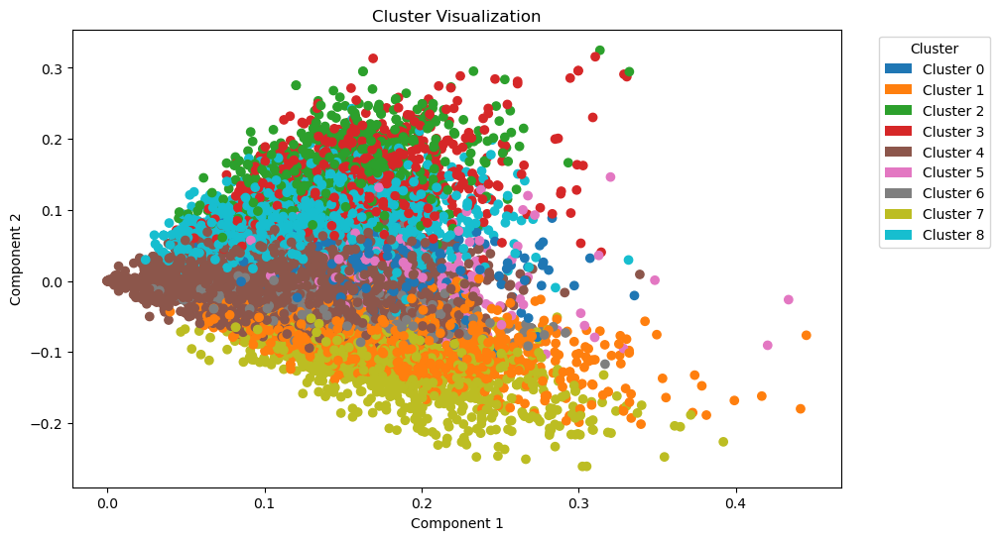

In [92]:
visualize_clusters(tfidf_df, kmeans_9.labels_, n_clusters=9)

### Confusion matrix

In [93]:
data_means_9 = df
labels_kmeans_9 = kmeans_9.labels_
data_means_9['Cluster'] = labels_kmeans_9
data_means_9.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 13966 entries, 12727 to 19755
Data columns (total 27 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   text                     13966 non-null  object 
 1   newsgroup                13966 non-null  object 
 2   sentences                13966 non-null  int64  
 3   question_marks_ratio     13966 non-null  float64
 4   exclamation_marks_ratio  13966 non-null  float64
 5   links                    13966 non-null  int64  
 6   emails_addresses         13966 non-null  int64  
 7   chars                    13966 non-null  int64  
 8   capital_letters_ratio    13966 non-null  float64
 9   organizations_ratio      13966 non-null  float64
 10  money_ratio              13966 non-null  float64
 11  person_ratio             13966 non-null  float64
 12  company_ratio            13966 non-null  float64
 13  gpe_ratio                13966 non-null  float64
 14  date_ratio        

/tmp/ipykernel_26088/379176068.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_means_9['Cluster'] = labels_kmeans_9


In [94]:
data_means_9

,text,newsgroup,sentences,question_marks_ratio,exclamation_marks_ratio,links,emails_addresses,chars,capital_letters_ratio,organizations_ratio,...,verb_ratio,adv_ratio,words,unique_words,lexical_div,avg_word_length,negative,positive,neutral,Cluster
12727,article robert castro writes would anyone dodl...,rec.motorcycles,14,0.071429,0.571429,0,3,1335,0.058878,0.008989,...,0.218978,0.051095,137,117,1.170940,9.744526,0.033,0.139,0.828,4
12958,article jerry hartzler cat write article micha...,rec.motorcycles,5,0.000000,0.000000,0,5,402,0.072508,0.007463,...,0.205128,0.102564,39,36,1.083333,10.307692,0.068,0.093,0.839,4
17116,try unsubscribe group send email doesnt work c...,comp.windows.x,4,0.250000,0.000000,0,1,397,0.081818,0.035264,...,0.142857,0.023810,42,40,1.050000,9.452381,0.027,0.107,0.867,8
6186,article john eaton write thats one problem far...,sci.crypt,13,0.230769,0.000000,0,2,1334,0.018051,0.000000,...,0.191667,0.058333,120,109,1.100917,11.116667,0.129,0.218,0.653,5
6782,key question whether nonclipper encryption mak...,sci.crypt,16,0.125000,0.000000,0,1,1906,0.018657,0.005771,...,0.242604,0.053254,169,134,1.261194,11.278107,0.120,0.231,0.649,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11051,price seem good would like know give away secr...,comp.sys.mac.hardware,5,0.000000,0.000000,0,0,258,0.110577,0.000000,...,0.333333,0.041667,24,23,1.043478,10.750000,0.000,0.273,0.727,4
17409,get compwindowsx justin kibell system programm...,comp.windows.x,4,0.250000,0.000000,0,1,195,0.136095,0.051282,...,0.150000,0.000000,20,20,1.000000,9.750000,0.000,0.000,1.000,8
8032,watch detroitminnesota game last night think s...,rec.sport.hockey,5,0.400000,0.400000,0,2,251,0.053398,0.019920,...,0.240000,0.000000,25,23,1.086957,10.040000,0.000,0.087,0.913,6
13540,article jon livesey write article douglas grah...,alt.atheism,17,0.058824,0.000000,0,5,2611,0.045057,0.012256,...,0.212500,0.050000,240,186,1.290323,10.879167,0.077,0.210,0.713,1


In [95]:
df_matrix_9 = calculate_cluster_ratio(data_means_9)

In [96]:
df_matrix_9

,newsgroup,Cluster,count,ratio
0,rec.motorcycles,4,594.0,11.294923
1,rec.motorcycles,8,34.0,1.452991
2,rec.motorcycles,5,NaN,0.000000
3,rec.motorcycles,3,1.0,0.107527
4,rec.motorcycles,1,9.0,0.491803
...,...,...,...,...
175,sci.electronics,1,2.0,0.109290
176,sci.electronics,0,16.0,3.149606
177,sci.electronics,6,2.0,0.215750
178,sci.electronics,7,1.0,0.090580


In [97]:
kmeans_df_matrix_9 = calculate_cluster_ratio(data_means_9)

In [98]:
kmeans_df_matrix_9

,newsgroup,Cluster,count,ratio
0,rec.motorcycles,4,594.0,11.294923
1,rec.motorcycles,8,34.0,1.452991
2,rec.motorcycles,5,NaN,0.000000
3,rec.motorcycles,3,1.0,0.107527
4,rec.motorcycles,1,9.0,0.491803
...,...,...,...,...
175,sci.electronics,1,2.0,0.109290
176,sci.electronics,0,16.0,3.149606
177,sci.electronics,6,2.0,0.215750
178,sci.electronics,7,1.0,0.090580


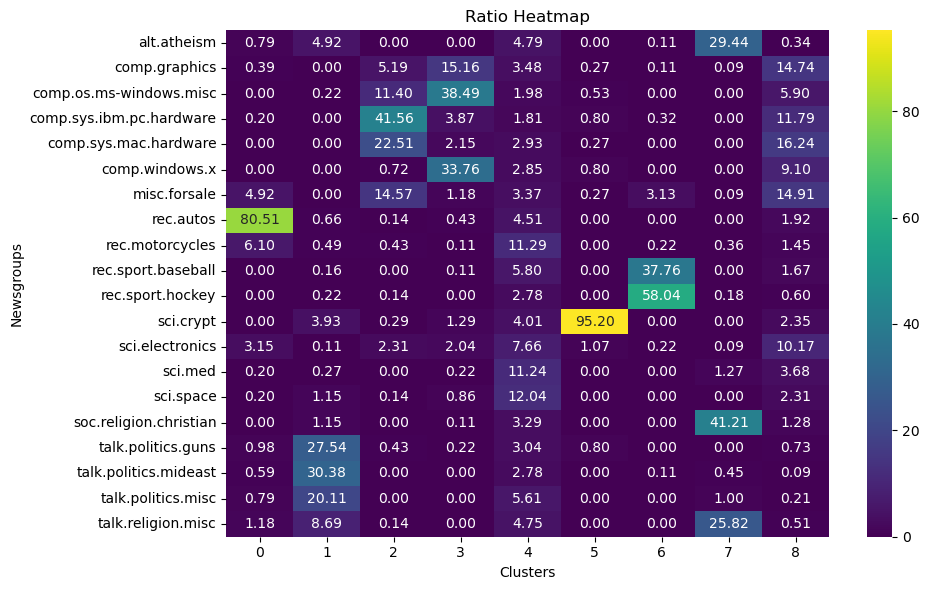

In [99]:
draw_ratio_heatmap(kmeans_df_matrix_9)

# 8 clusters

In [100]:
kmeans_8 = kmeans(tfidf_df, 8)

Within-cluster sum of squares: -13412.499
Silhouette Score: 0.005
Calinski Harabasz Score: 41.513
Davies Bouldin: 9.611
Homogeneity: 0.271


In [101]:
km_centroids_8, km_terms_8= print_most_relevant_terms(kmeans_8, tfidf_vectorizer, 8)

Cluster 0: write article know use thanks like email im dont think
Cluster 1: window file program use run thanks image work version windows
Cluster 2: people government say right article write gun make dont think
Cluster 3: drive scsi disk controller ide hard floppy mac use problem
Cluster 4: game team player play year win hockey fan baseball season
Cluster 5: car bike engine article write like good look drive dod
Cluster 6: god christian jesus say believe church bible christ people faith
Cluster 7: card driver video ati monitor bus use diamond vga color


In [102]:
count_rows_in_clusters(kmeans_8.labels_)

array([6583, 1429, 2535,  412,  933,  818,  887,  369])

0


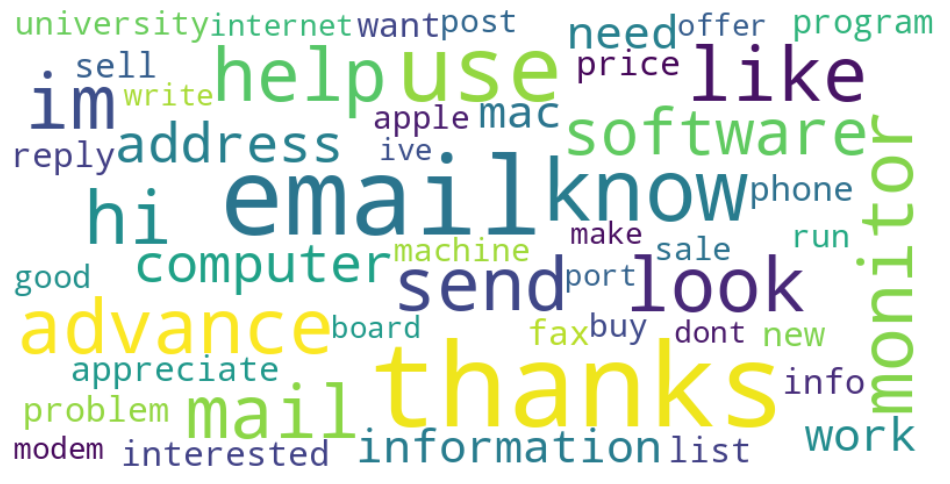

1


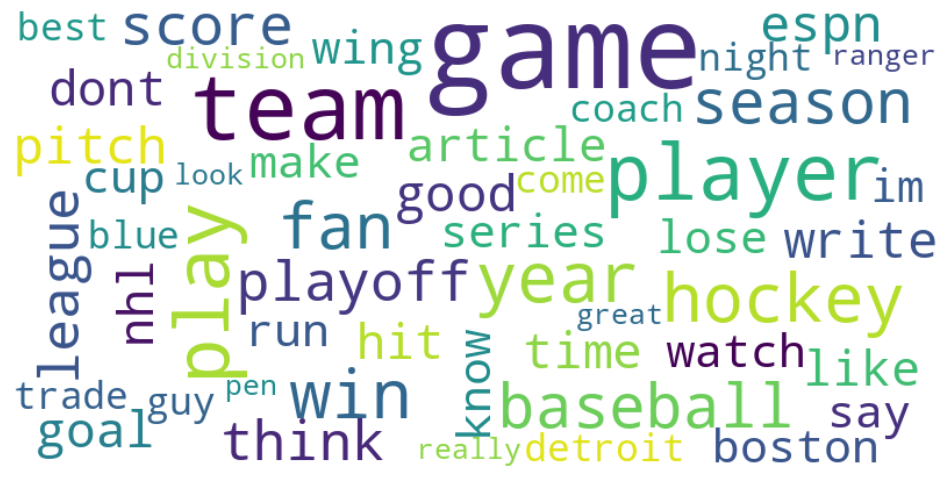

2


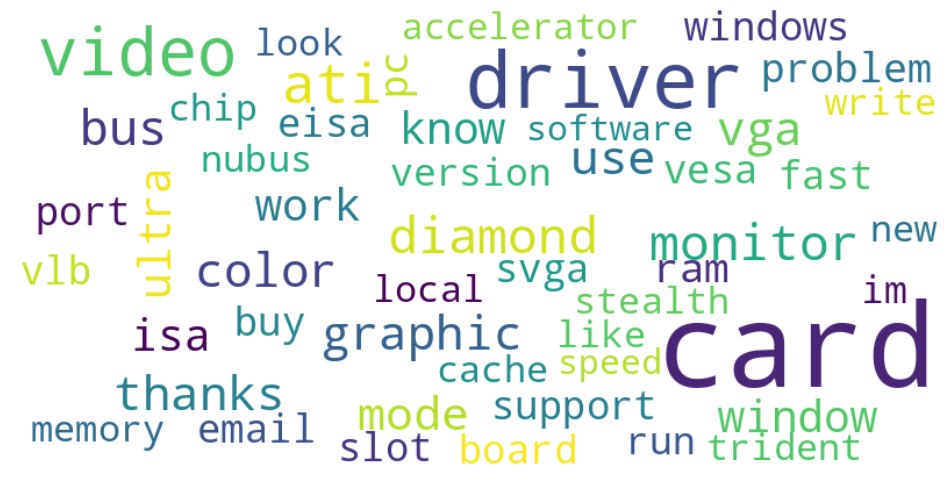

3


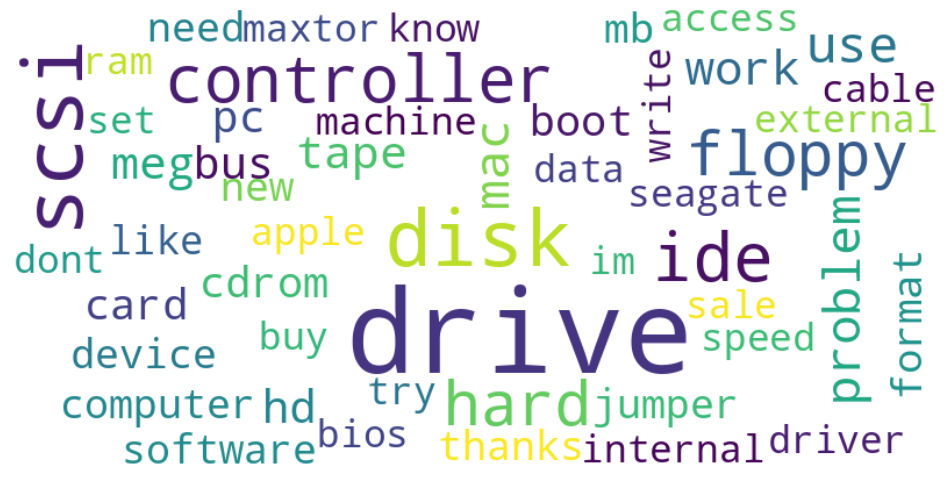

4


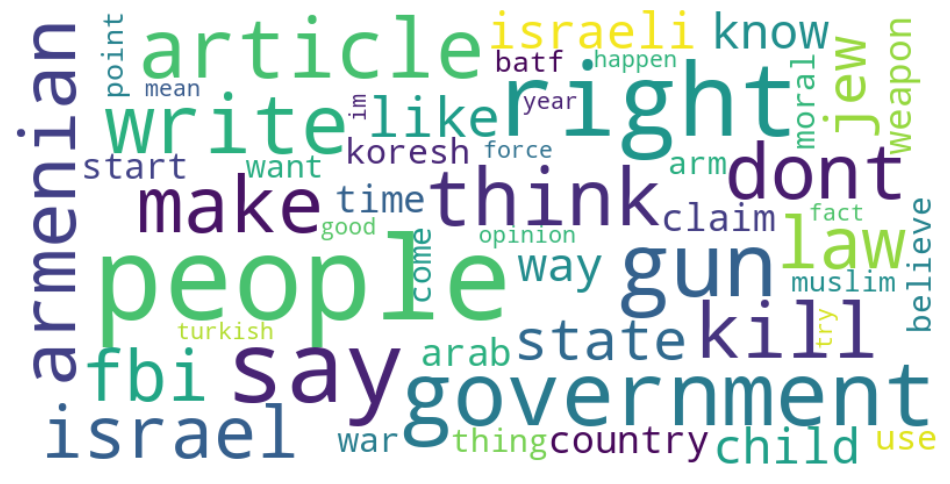

5


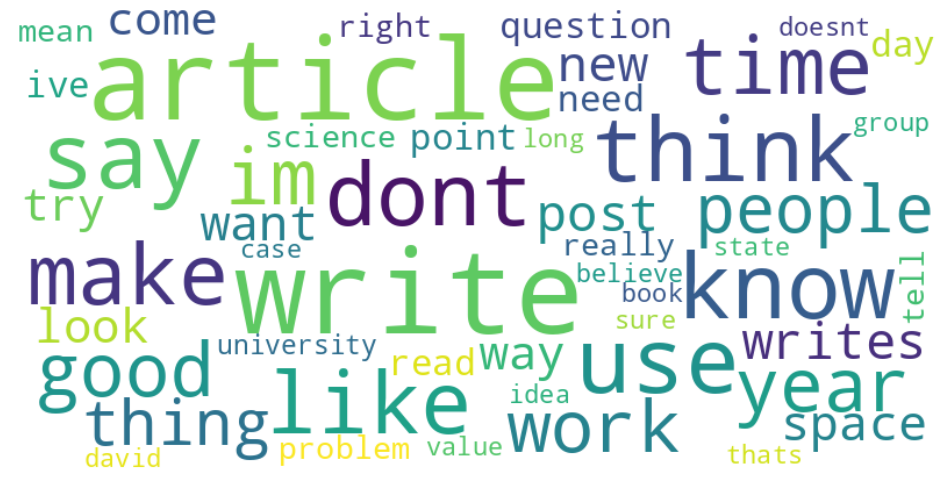

6


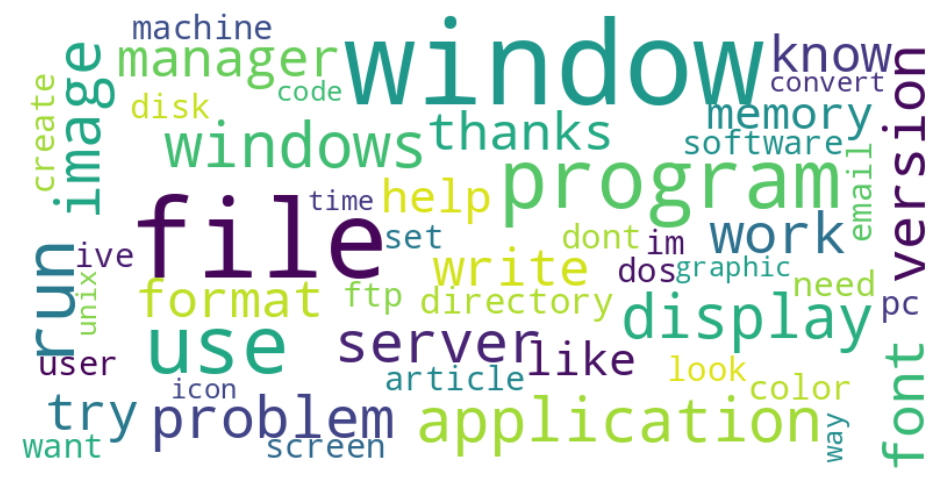

7


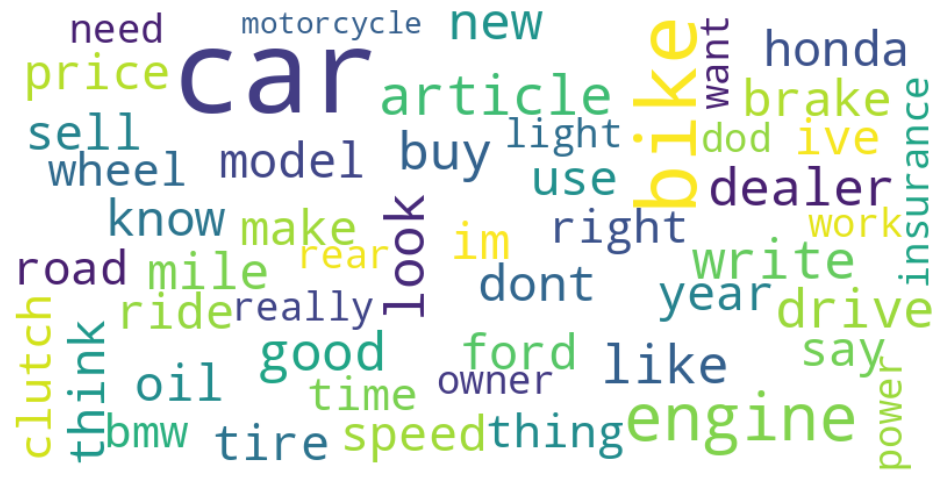

In [103]:
for i in range(8):
    freq = frequencies_dict(i, kmeans_10, km_centroids_10, km_terms_10)
    print(i)
    makeWordCloud(freq)

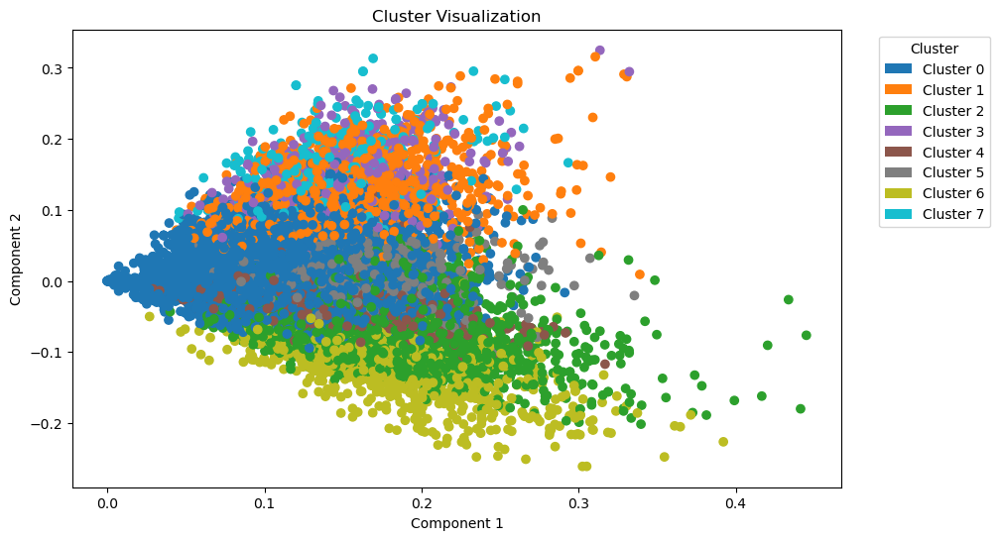

In [104]:
visualize_clusters(tfidf_df, kmeans_8.labels_, n_clusters=8)

### Confusion matrix

In [105]:
data_means_8 = df
labels_kmeans_8 = kmeans_8.labels_
data_means_8['Cluster'] = labels_kmeans_8
data_means_8.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 13966 entries, 12727 to 19755
Data columns (total 27 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   text                     13966 non-null  object 
 1   newsgroup                13966 non-null  object 
 2   sentences                13966 non-null  int64  
 3   question_marks_ratio     13966 non-null  float64
 4   exclamation_marks_ratio  13966 non-null  float64
 5   links                    13966 non-null  int64  
 6   emails_addresses         13966 non-null  int64  
 7   chars                    13966 non-null  int64  
 8   capital_letters_ratio    13966 non-null  float64
 9   organizations_ratio      13966 non-null  float64
 10  money_ratio              13966 non-null  float64
 11  person_ratio             13966 non-null  float64
 12  company_ratio            13966 non-null  float64
 13  gpe_ratio                13966 non-null  float64
 14  date_ratio        

/tmp/ipykernel_26088/672252935.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_means_8['Cluster'] = labels_kmeans_8


In [106]:
df_matrix_8 = calculate_cluster_ratio(data_means_8)

In [107]:
kmeans_df_matrix_8 = calculate_cluster_ratio(data_means_8)

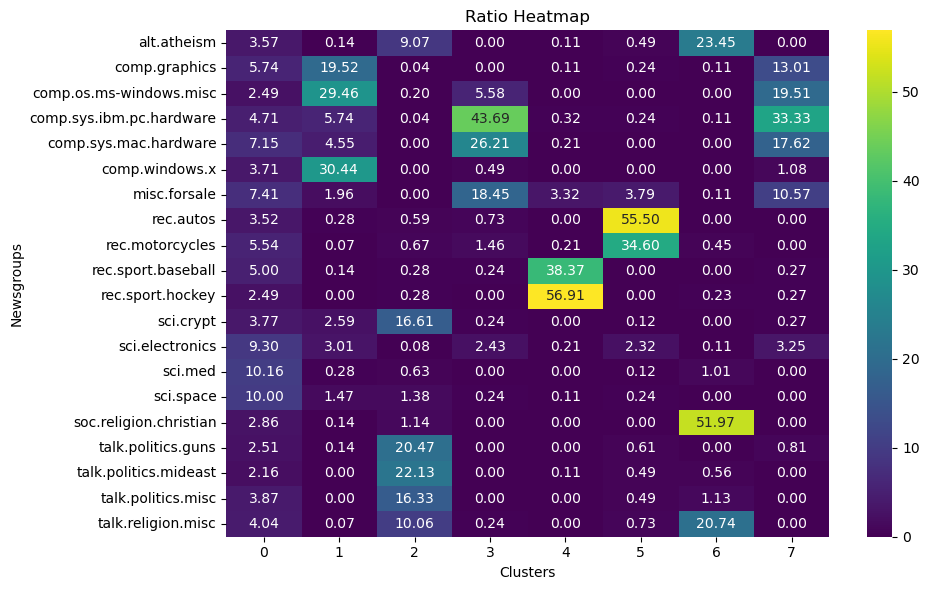

In [108]:
draw_ratio_heatmap(kmeans_df_matrix_8)

# 7 clusters (n of subgroups)

In [109]:
kmeans_7 = kmeans(tfidf_df, 7)

Within-cluster sum of squares: -13439.585
Silhouette Score: 0.005
Calinski Harabasz Score: 43.649
Davies Bouldin: 10.190
Homogeneity: 0.265


In [110]:
km_centroids_7, km_terms_7 = print_most_relevant_terms(kmeans_7, tfidf_vectorizer, 7)

Cluster 0: people say article write government right think make dont gun
Cluster 1: window file program use run thanks image windows display application
Cluster 2: car engine drive article look write dealer good ford buy
Cluster 3: game team player play year hockey win fan baseball season
Cluster 4: card drive scsi disk driver controller use ide video bus
Cluster 5: god christian jesus say believe church bible christ faith people
Cluster 6: write use article know thanks like email im dont look


In [111]:
count_rows_in_clusters(kmeans_7.labels_)

array([2929, 1276,  521,  988,  803,  832, 6617])

In [112]:
from wordcloud import WordCloud
import matplotlib.pyplot as plt

def makeWordCloud(frequencies,i):

    wordcloud = WordCloud(width=800, height=400, max_font_size=100, background_color="white", max_words = 50)
    wordcloud.generate_from_frequencies(frequencies)

    plt.figure(figsize=(12, 10))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")

    #current_dir = os.getcwd()
    #filename = f"wordcloud_{i}.png"
    #save_path = os.path.join(current_dir, filename)
    #plt.savefig(save_path, dpi=300, bbox_inches='tight')

    plt.show()



0


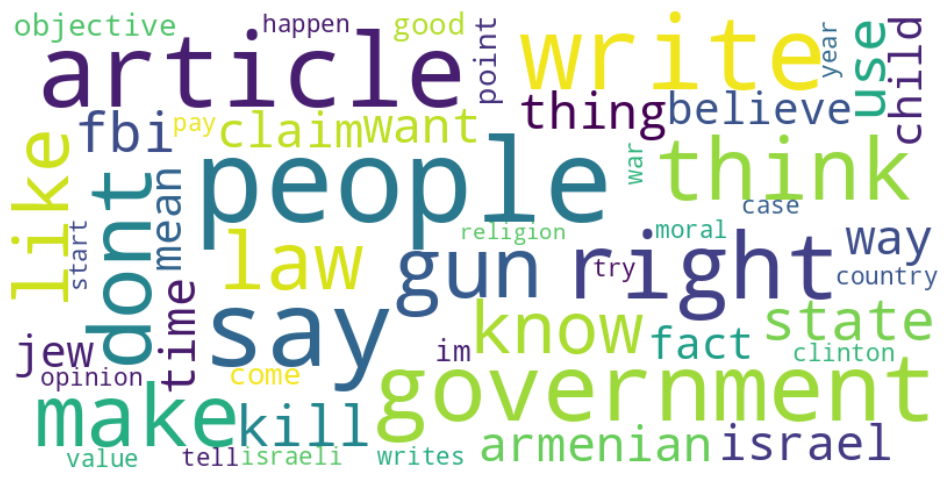

1


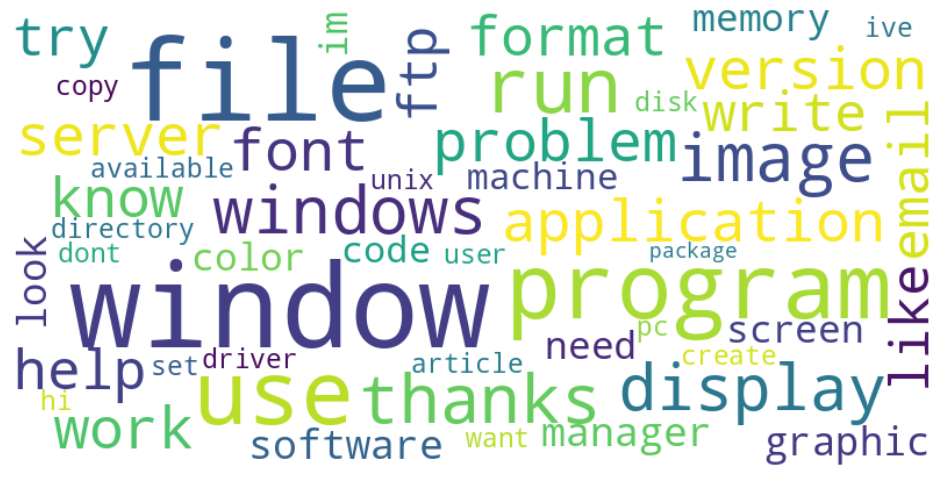

2


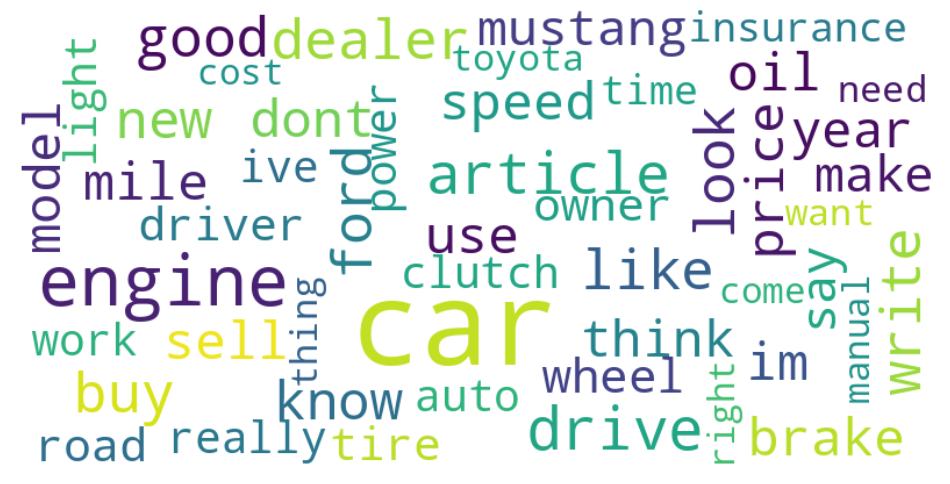

3


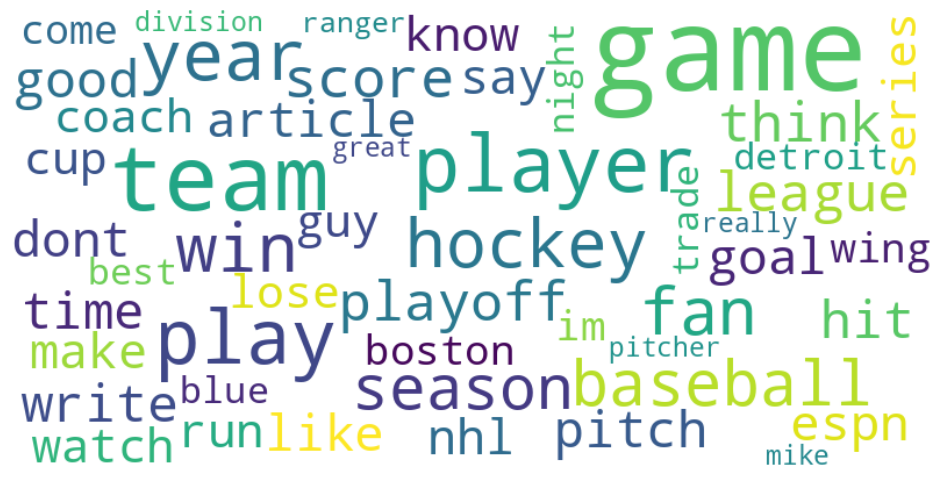

4


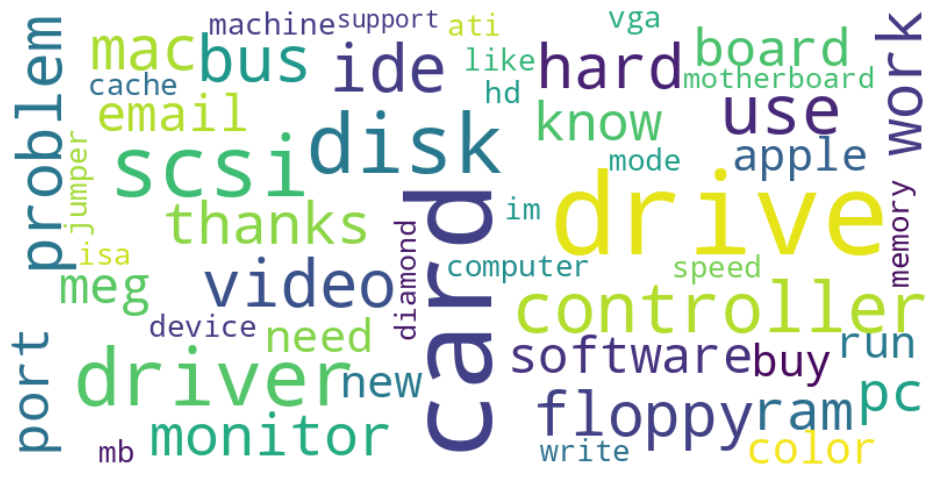

5


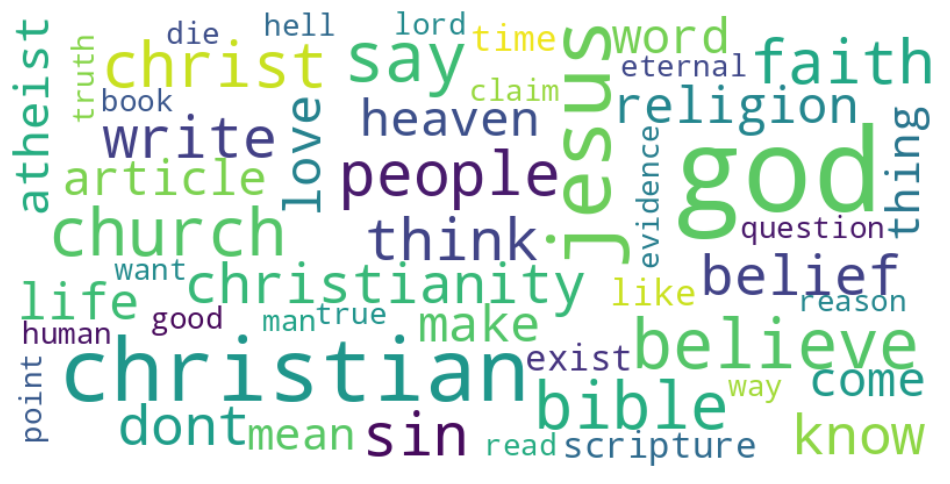

6


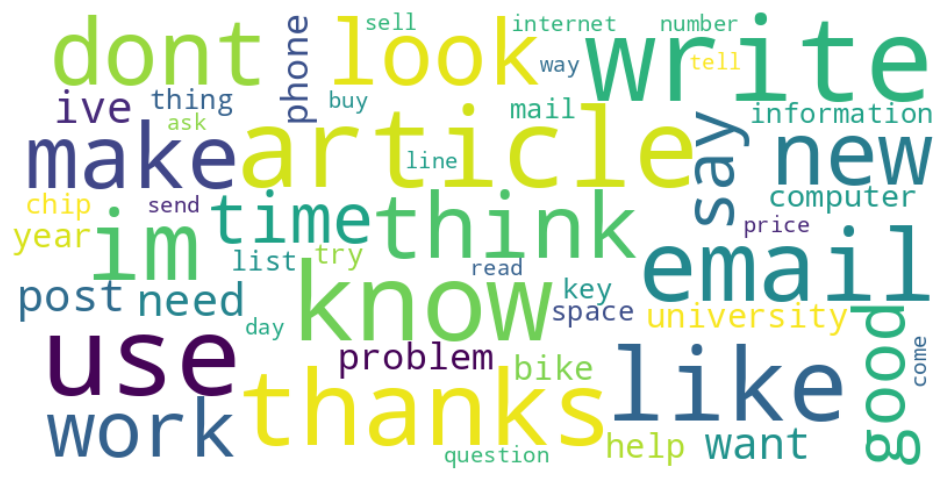

In [113]:
for i in range(7):
    freq = frequencies_dict(i, kmeans_7, km_centroids_7, km_terms_7)
    print(i)
    makeWordCloud(freq,i)

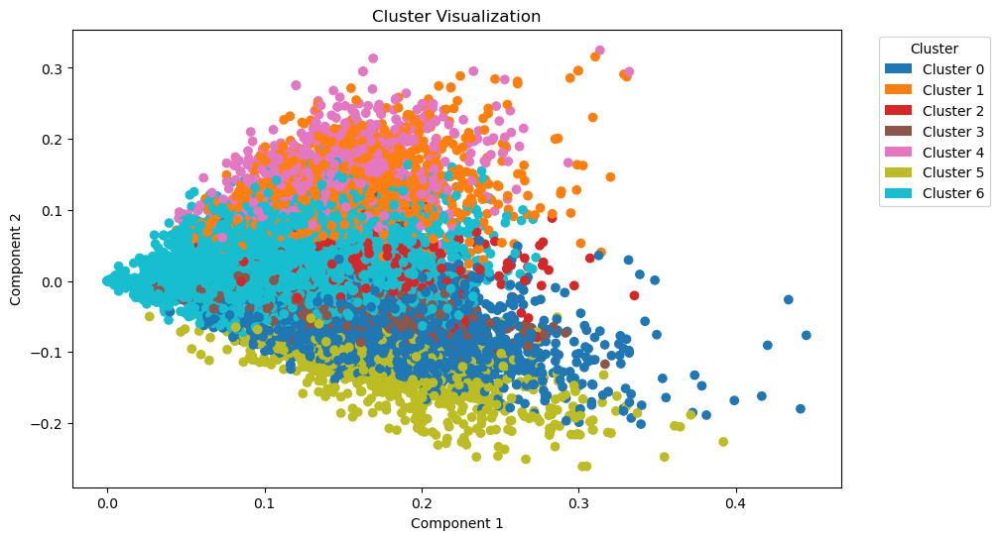

In [114]:
visualize_clusters(tfidf_df, kmeans_7.labels_, n_clusters=7)

### Confusion matrix

In [115]:
data_means_7 = df
labels_kmeans_7 = kmeans_7.labels_
data_means_7['Cluster'] = labels_kmeans_7
data_means_7.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 13966 entries, 12727 to 19755
Data columns (total 27 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   text                     13966 non-null  object 
 1   newsgroup                13966 non-null  object 
 2   sentences                13966 non-null  int64  
 3   question_marks_ratio     13966 non-null  float64
 4   exclamation_marks_ratio  13966 non-null  float64
 5   links                    13966 non-null  int64  
 6   emails_addresses         13966 non-null  int64  
 7   chars                    13966 non-null  int64  
 8   capital_letters_ratio    13966 non-null  float64
 9   organizations_ratio      13966 non-null  float64
 10  money_ratio              13966 non-null  float64
 11  person_ratio             13966 non-null  float64
 12  company_ratio            13966 non-null  float64
 13  gpe_ratio                13966 non-null  float64
 14  date_ratio        

/tmp/ipykernel_26088/1205690639.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_means_7['Cluster'] = labels_kmeans_7


In [116]:
df_matrix_7 = calculate_cluster_ratio(data_means_7)

In [117]:
kmeans_df_matrix_7= calculate_cluster_ratio(data_means_7)

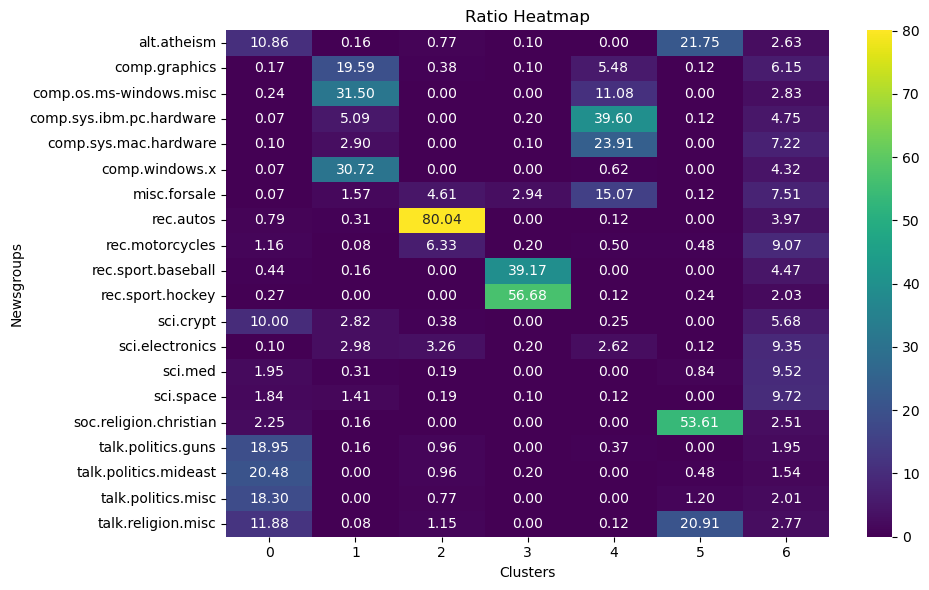

In [118]:
draw_ratio_heatmap(kmeans_df_matrix_7)

# Picking the ultimate number of clusters

We picked 7 clusters, because for this number of clusters the clusters are well distributed (based on clusters plot).

Also in the heatmatrix of ratio in each newsgroup, they are well-fitted to the clusters according to their type.

## Cross-validation

In [119]:
from sklearn.model_selection import cross_val_score

scores = cross_val_score(kmeans_7, tfidf_df, cv = 5)
print("Cross-validation scores:", scores)
print("Average score:", scores.mean())

Cross-validation scores: [-2689.6221696  -2692.98328148 -2691.45601242 -2691.61927696
 -2690.25546726]
Average score: -2691.1872415432563


The results are similar so the model is rather stable.